<a href="https://colab.research.google.com/github/law-levi-san/Quantitative-Analysis-of-Blood-Cell-Components-and-Detection-of-Malarial-Parasite-using-Faster-R-CNN/blob/main/GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [51]:
project_name = '06b-bccd-dcgan'

In [52]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [53]:
# Uncomment and install libraries if imports fail
!conda install numpy pandas pytorch torchvision cpuonly -c pytorch -y
!pip install matplotlib --upgrade --quiet

/bin/bash: line 1: conda: command not found


In [54]:
DATA_DIR = '/content/drive/MyDrive/cells'

In [55]:
import os

print(os.listdir(DATA_DIR))

['JPEGImages']


In [56]:
print(os.listdir(DATA_DIR+'/JPEGImages')[:10])

['BloodImage_00006.jpg', 'BloodImage_00002.jpg', 'BloodImage_00007.jpg', 'BloodImage_00009.jpg', 'BloodImage_00000.jpg', 'BloodImage_00012.jpg', 'BloodImage_00015.jpg', 'BloodImage_00010.jpg', 'BloodImage_00004.jpg', 'BloodImage_00014.jpg']


In [57]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T

In [58]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [59]:
train_ds = ImageFolder(DATA_DIR, transform=T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

In [60]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

In [61]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [62]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

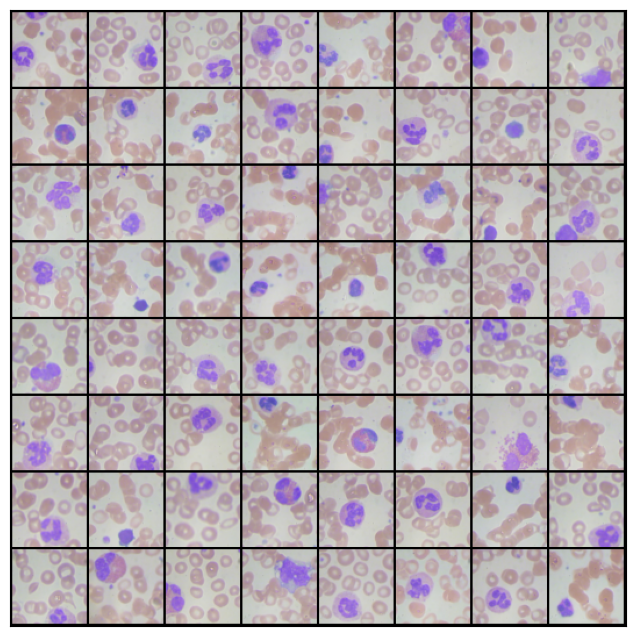

In [63]:
show_batch(train_dl)

In [64]:
!pip install jovian --upgrade --quiet

In [65]:
import jovian

In [66]:
jovian.commit(project=project_name, environment=None)

[jovian] Detected Colab notebook...
[jovian] jovian.commit() is no longer required on Google Colab. If you ran this notebook from Jovian, 
then just save this file in Colab using Ctrl+S/Cmd+S and it will be updated on Jovian. 
Also, you can also delete this cell, it's no longer necessary.


In [67]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')

def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [68]:
device = get_default_device()
device

device(type='cuda')

In [69]:
train_dl = DeviceDataLoader(train_dl, device)

In [70]:
import torch.nn as nn

In [71]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [72]:
discriminator = to_device(discriminator, device)

In [73]:
latent_size = 128

In [74]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

torch.Size([128, 3, 64, 64])


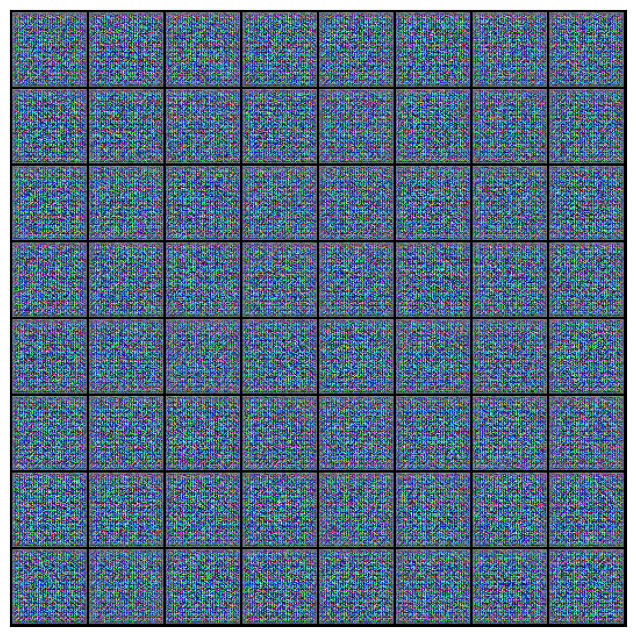

In [75]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [76]:
generator = to_device(generator, device)

In [77]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

In [78]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)

    # Update generator weights
    loss.backward()
    opt_g.step()

    return loss.item()

In [79]:
from torchvision.utils import save_image

In [80]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [81]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [82]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Saving generated-images-0000.png


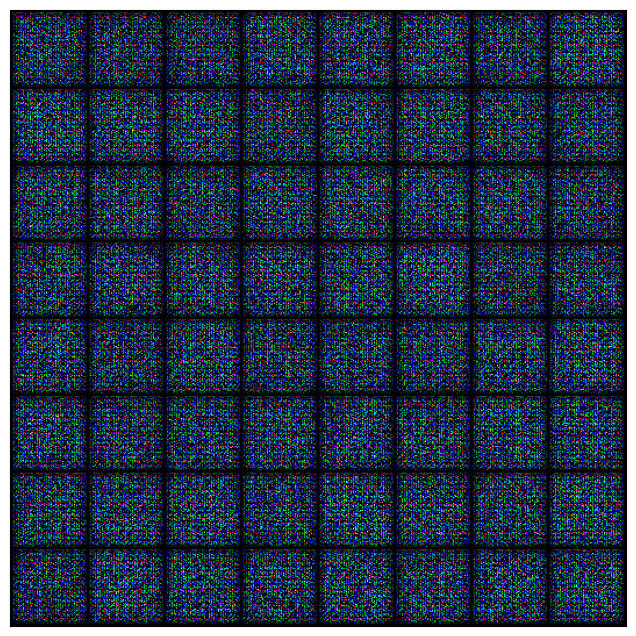

In [83]:
save_samples(0, fixed_latent)

In [84]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [85]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()

    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []

    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))

    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)

        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)

        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))

        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)

    return losses_g, losses_d, real_scores, fake_scores

In [86]:
lr = 0.0002
epochs = 500

In [87]:
jovian.reset()
jovian.log_hyperparams(lr=lr, epochs=epochs)

[jovian] Hyperparams logged.


In [88]:
history = fit(epochs, lr)

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [1/1000], loss_g: 4.1686, loss_d: 0.5105, real_score: 0.8130, fake_score: 0.2503
Saving generated-images-0001.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [2/1000], loss_g: 6.1102, loss_d: 0.2199, real_score: 0.9324, fake_score: 0.1349
Saving generated-images-0002.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [3/1000], loss_g: 7.3227, loss_d: 0.0886, real_score: 0.9719, fake_score: 0.0574
Saving generated-images-0003.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [4/1000], loss_g: 7.8368, loss_d: 0.0470, real_score: 0.9834, fake_score: 0.0295
Saving generated-images-0004.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [5/1000], loss_g: 8.3540, loss_d: 0.0394, real_score: 0.9926, fake_score: 0.0314
Saving generated-images-0005.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [6/1000], loss_g: 8.3482, loss_d: 0.0250, real_score: 0.9941, fake_score: 0.0188
Saving generated-images-0006.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [7/1000], loss_g: 8.4501, loss_d: 0.0172, real_score: 0.9940, fake_score: 0.0111
Saving generated-images-0007.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [8/1000], loss_g: 8.8573, loss_d: 0.0195, real_score: 0.9951, fake_score: 0.0144
Saving generated-images-0008.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [9/1000], loss_g: 8.4815, loss_d: 0.0123, real_score: 0.9958, fake_score: 0.0081
Saving generated-images-0009.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [10/1000], loss_g: 8.4015, loss_d: 0.0112, real_score: 0.9968, fake_score: 0.0080
Saving generated-images-0010.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [11/1000], loss_g: 9.1913, loss_d: 0.0137, real_score: 0.9966, fake_score: 0.0102
Saving generated-images-0011.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [12/1000], loss_g: 9.1185, loss_d: 0.0112, real_score: 0.9969, fake_score: 0.0080
Saving generated-images-0012.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [13/1000], loss_g: 8.6831, loss_d: 0.0078, real_score: 0.9976, fake_score: 0.0054
Saving generated-images-0013.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [14/1000], loss_g: 9.0418, loss_d: 0.0088, real_score: 0.9974, fake_score: 0.0062
Saving generated-images-0014.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [15/1000], loss_g: 8.8078, loss_d: 0.0058, real_score: 0.9974, fake_score: 0.0032
Saving generated-images-0015.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [16/1000], loss_g: 9.1258, loss_d: 0.0076, real_score: 0.9981, fake_score: 0.0057
Saving generated-images-0016.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [17/1000], loss_g: 8.9437, loss_d: 0.0076, real_score: 0.9961, fake_score: 0.0037
Saving generated-images-0017.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [18/1000], loss_g: 9.0925, loss_d: 0.0053, real_score: 0.9978, fake_score: 0.0031
Saving generated-images-0018.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [19/1000], loss_g: 8.9736, loss_d: 0.0061, real_score: 0.9981, fake_score: 0.0042
Saving generated-images-0019.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [20/1000], loss_g: 9.0868, loss_d: 0.0056, real_score: 0.9985, fake_score: 0.0040
Saving generated-images-0020.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [21/1000], loss_g: 9.5984, loss_d: 0.0087, real_score: 0.9960, fake_score: 0.0047
Saving generated-images-0021.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [22/1000], loss_g: 10.4158, loss_d: 0.0089, real_score: 0.9975, fake_score: 0.0064
Saving generated-images-0022.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [23/1000], loss_g: 12.9405, loss_d: 0.0125, real_score: 0.9978, fake_score: 0.0102
Saving generated-images-0023.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [24/1000], loss_g: 20.6729, loss_d: 13.7731, real_score: 0.0000, fake_score: 0.0000
Saving generated-images-0024.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [25/1000], loss_g: 13.5718, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0025.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [26/1000], loss_g: 13.1303, loss_d: 0.4455, real_score: 1.0000, fake_score: 0.3530
Saving generated-images-0026.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [27/1000], loss_g: 13.2829, loss_d: 0.0001, real_score: 0.9999, fake_score: 0.0000
Saving generated-images-0027.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [28/1000], loss_g: 14.0109, loss_d: 0.3486, real_score: 0.9998, fake_score: 0.2909
Saving generated-images-0028.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [29/1000], loss_g: 13.1285, loss_d: 0.0152, real_score: 0.9861, fake_score: 0.0000
Saving generated-images-0029.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [30/1000], loss_g: 5.8865, loss_d: 0.0067, real_score: 0.9983, fake_score: 0.0049
Saving generated-images-0030.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [31/1000], loss_g: 14.3011, loss_d: 0.0037, real_score: 0.9963, fake_score: 0.0000
Saving generated-images-0031.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [32/1000], loss_g: 10.6988, loss_d: 0.0005, real_score: 0.9995, fake_score: 0.0000
Saving generated-images-0032.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [33/1000], loss_g: 13.9063, loss_d: 3.3976, real_score: 0.9997, fake_score: 0.9647
Saving generated-images-0033.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [34/1000], loss_g: 14.6902, loss_d: 0.1571, real_score: 0.8869, fake_score: 0.0000
Saving generated-images-0034.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [35/1000], loss_g: 13.0325, loss_d: 0.0038, real_score: 0.9962, fake_score: 0.0000
Saving generated-images-0035.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [36/1000], loss_g: 8.7862, loss_d: 0.0027, real_score: 0.9978, fake_score: 0.0005
Saving generated-images-0036.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [37/1000], loss_g: 7.5539, loss_d: 0.0354, real_score: 0.9953, fake_score: 0.0296
Saving generated-images-0037.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [38/1000], loss_g: 9.7797, loss_d: 0.1439, real_score: 0.8831, fake_score: 0.0011
Saving generated-images-0038.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [39/1000], loss_g: 15.2999, loss_d: 1.1777, real_score: 0.9927, fake_score: 0.6515
Saving generated-images-0039.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [40/1000], loss_g: 9.3169, loss_d: 0.0009, real_score: 0.9994, fake_score: 0.0003
Saving generated-images-0040.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [41/1000], loss_g: 7.3183, loss_d: 0.6114, real_score: 0.9998, fake_score: 0.4253
Saving generated-images-0041.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [42/1000], loss_g: 5.4368, loss_d: 0.0305, real_score: 0.9961, fake_score: 0.0262
Saving generated-images-0042.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [43/1000], loss_g: 5.5873, loss_d: 0.0695, real_score: 0.9565, fake_score: 0.0203
Saving generated-images-0043.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [44/1000], loss_g: 6.4487, loss_d: 0.2487, real_score: 0.8172, fake_score: 0.0052
Saving generated-images-0044.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [45/1000], loss_g: 7.9272, loss_d: 0.1568, real_score: 0.9880, fake_score: 0.1336
Saving generated-images-0045.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [46/1000], loss_g: 6.8461, loss_d: 0.1468, real_score: 0.9844, fake_score: 0.1210
Saving generated-images-0046.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [47/1000], loss_g: 6.7052, loss_d: 0.1230, real_score: 0.9861, fake_score: 0.1017
Saving generated-images-0047.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [48/1000], loss_g: 4.7378, loss_d: 0.1229, real_score: 0.9197, fake_score: 0.0320
Saving generated-images-0048.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [49/1000], loss_g: 8.8963, loss_d: 3.6486, real_score: 0.9998, fake_score: 0.9615
Saving generated-images-0049.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [50/1000], loss_g: 4.0204, loss_d: 0.2178, real_score: 0.8629, fake_score: 0.0136
Saving generated-images-0050.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [51/1000], loss_g: 3.8082, loss_d: 0.1778, real_score: 0.9704, fake_score: 0.1338
Saving generated-images-0051.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [52/1000], loss_g: 3.3876, loss_d: 0.2352, real_score: 0.9147, fake_score: 0.1274
Saving generated-images-0052.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [53/1000], loss_g: 3.9987, loss_d: 0.3077, real_score: 0.8855, fake_score: 0.1579
Saving generated-images-0053.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [54/1000], loss_g: 4.7749, loss_d: 0.1552, real_score: 0.9567, fake_score: 0.1030
Saving generated-images-0054.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [55/1000], loss_g: 4.9890, loss_d: 0.1683, real_score: 0.9412, fake_score: 0.0990
Saving generated-images-0055.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [56/1000], loss_g: 4.8652, loss_d: 0.1283, real_score: 0.9367, fake_score: 0.0574
Saving generated-images-0056.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [57/1000], loss_g: 4.2328, loss_d: 0.1524, real_score: 0.9111, fake_score: 0.0518
Saving generated-images-0057.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [58/1000], loss_g: 6.3230, loss_d: 0.1692, real_score: 0.9798, fake_score: 0.1354
Saving generated-images-0058.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [59/1000], loss_g: 0.2605, loss_d: 1.6672, real_score: 0.2689, fake_score: 0.0016
Saving generated-images-0059.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [60/1000], loss_g: 6.2353, loss_d: 0.7806, real_score: 0.5472, fake_score: 0.0006
Saving generated-images-0060.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [61/1000], loss_g: 3.5941, loss_d: 0.2689, real_score: 0.9938, fake_score: 0.2193
Saving generated-images-0061.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [62/1000], loss_g: 4.2973, loss_d: 0.1052, real_score: 0.9459, fake_score: 0.0453
Saving generated-images-0062.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [63/1000], loss_g: 3.9567, loss_d: 0.1905, real_score: 0.9080, fake_score: 0.0826
Saving generated-images-0063.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [64/1000], loss_g: 4.0009, loss_d: 0.2090, real_score: 0.9153, fake_score: 0.1082
Saving generated-images-0064.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [65/1000], loss_g: 4.0649, loss_d: 0.1483, real_score: 0.9402, fake_score: 0.0803
Saving generated-images-0065.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [66/1000], loss_g: 4.5092, loss_d: 0.1896, real_score: 0.9214, fake_score: 0.0976
Saving generated-images-0066.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [67/1000], loss_g: 3.8317, loss_d: 0.1153, real_score: 0.9200, fake_score: 0.0262
Saving generated-images-0067.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [68/1000], loss_g: 2.4606, loss_d: 0.2173, real_score: 0.8448, fake_score: 0.0229
Saving generated-images-0068.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [69/1000], loss_g: 9.2002, loss_d: 2.4236, real_score: 0.9993, fake_score: 0.8416
Saving generated-images-0069.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [70/1000], loss_g: 2.8136, loss_d: 0.1213, real_score: 0.9578, fake_score: 0.0578
Saving generated-images-0070.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [71/1000], loss_g: 3.8921, loss_d: 0.1391, real_score: 0.9758, fake_score: 0.1017
Saving generated-images-0071.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [72/1000], loss_g: 3.1540, loss_d: 0.1817, real_score: 0.9462, fake_score: 0.1062
Saving generated-images-0072.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [73/1000], loss_g: 3.6761, loss_d: 0.3065, real_score: 0.9059, fake_score: 0.1691
Saving generated-images-0073.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [74/1000], loss_g: 3.9271, loss_d: 0.2645, real_score: 0.9112, fake_score: 0.1399
Saving generated-images-0074.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [75/1000], loss_g: 4.4532, loss_d: 0.1518, real_score: 0.9559, fake_score: 0.0983
Saving generated-images-0075.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [76/1000], loss_g: 4.6107, loss_d: 0.1153, real_score: 0.9492, fake_score: 0.0575
Saving generated-images-0076.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [77/1000], loss_g: 4.1487, loss_d: 0.0604, real_score: 0.9611, fake_score: 0.0189
Saving generated-images-0077.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [78/1000], loss_g: 5.8579, loss_d: 0.0860, real_score: 0.9292, fake_score: 0.0024
Saving generated-images-0078.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [79/1000], loss_g: 5.4975, loss_d: 0.0996, real_score: 0.9313, fake_score: 0.0205
Saving generated-images-0079.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [80/1000], loss_g: 3.9353, loss_d: 0.1891, real_score: 0.9069, fake_score: 0.0761
Saving generated-images-0080.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [81/1000], loss_g: 5.2083, loss_d: 0.2555, real_score: 0.9018, fake_score: 0.1247
Saving generated-images-0081.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [82/1000], loss_g: 3.7452, loss_d: 3.7854, real_score: 0.0740, fake_score: 0.0001
Saving generated-images-0082.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [83/1000], loss_g: 5.1352, loss_d: 0.1459, real_score: 0.9327, fake_score: 0.0619
Saving generated-images-0083.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [84/1000], loss_g: 2.5734, loss_d: 0.4813, real_score: 0.7328, fake_score: 0.0773
Saving generated-images-0084.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [85/1000], loss_g: 4.3791, loss_d: 0.2784, real_score: 0.9817, fake_score: 0.2178
Saving generated-images-0085.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [86/1000], loss_g: 3.9288, loss_d: 0.1394, real_score: 0.9414, fake_score: 0.0705
Saving generated-images-0086.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [87/1000], loss_g: 5.2706, loss_d: 0.2030, real_score: 0.9515, fake_score: 0.1317
Saving generated-images-0087.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [88/1000], loss_g: 2.0237, loss_d: 0.4810, real_score: 0.6986, fake_score: 0.0326
Saving generated-images-0088.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [89/1000], loss_g: 6.4125, loss_d: 0.0363, real_score: 0.9699, fake_score: 0.0047
Saving generated-images-0089.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [90/1000], loss_g: 4.0152, loss_d: 0.1420, real_score: 0.9645, fake_score: 0.0954
Saving generated-images-0090.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [91/1000], loss_g: 9.0345, loss_d: 4.7512, real_score: 0.9999, fake_score: 0.9880
Saving generated-images-0091.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [92/1000], loss_g: 2.2739, loss_d: 0.3780, real_score: 0.9185, fake_score: 0.1866
Saving generated-images-0092.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [93/1000], loss_g: 3.1924, loss_d: 0.3886, real_score: 0.7996, fake_score: 0.1093
Saving generated-images-0093.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [94/1000], loss_g: 2.6865, loss_d: 0.4261, real_score: 0.7539, fake_score: 0.1090
Saving generated-images-0094.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [95/1000], loss_g: 3.0149, loss_d: 0.2831, real_score: 0.8313, fake_score: 0.0847
Saving generated-images-0095.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [96/1000], loss_g: 3.2904, loss_d: 0.3184, real_score: 0.7661, fake_score: 0.0221
Saving generated-images-0096.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [97/1000], loss_g: 2.7301, loss_d: 1.0753, real_score: 0.4123, fake_score: 0.0067
Saving generated-images-0097.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [98/1000], loss_g: 3.9258, loss_d: 0.7546, real_score: 0.5288, fake_score: 0.0080
Saving generated-images-0098.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [99/1000], loss_g: 3.9788, loss_d: 0.1853, real_score: 0.9096, fake_score: 0.0808
Saving generated-images-0099.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [100/1000], loss_g: 2.7601, loss_d: 0.2939, real_score: 0.8400, fake_score: 0.0997
Saving generated-images-0100.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [101/1000], loss_g: 3.4165, loss_d: 0.2422, real_score: 0.9082, fake_score: 0.1277
Saving generated-images-0101.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [102/1000], loss_g: 7.2127, loss_d: 0.4597, real_score: 0.9617, fake_score: 0.3243
Saving generated-images-0102.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [103/1000], loss_g: 5.2863, loss_d: 1.9162, real_score: 0.2032, fake_score: 0.0007
Saving generated-images-0103.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [104/1000], loss_g: 3.9431, loss_d: 0.2902, real_score: 0.9592, fake_score: 0.1964
Saving generated-images-0104.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [105/1000], loss_g: 2.6878, loss_d: 0.4173, real_score: 0.8922, fake_score: 0.2395
Saving generated-images-0105.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [106/1000], loss_g: 3.6561, loss_d: 0.5038, real_score: 0.8792, fake_score: 0.2866
Saving generated-images-0106.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [107/1000], loss_g: 1.8263, loss_d: 1.0019, real_score: 0.4404, fake_score: 0.0161
Saving generated-images-0107.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [108/1000], loss_g: 2.1143, loss_d: 0.2454, real_score: 0.8627, fake_score: 0.0797
Saving generated-images-0108.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [109/1000], loss_g: 2.5493, loss_d: 0.3145, real_score: 0.8321, fake_score: 0.1040
Saving generated-images-0109.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [110/1000], loss_g: 3.1277, loss_d: 0.3400, real_score: 0.8721, fake_score: 0.1643
Saving generated-images-0110.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [111/1000], loss_g: 3.7554, loss_d: 0.2947, real_score: 0.9173, fake_score: 0.1751
Saving generated-images-0111.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [112/1000], loss_g: 4.9907, loss_d: 0.3567, real_score: 0.8646, fake_score: 0.1717
Saving generated-images-0112.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [113/1000], loss_g: 4.5153, loss_d: 0.1591, real_score: 0.8908, fake_score: 0.0359
Saving generated-images-0113.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [114/1000], loss_g: 3.5159, loss_d: 0.1055, real_score: 0.9629, fake_score: 0.0623
Saving generated-images-0114.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [115/1000], loss_g: 3.3827, loss_d: 4.0101, real_score: 0.0536, fake_score: 0.0001
Saving generated-images-0115.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [116/1000], loss_g: 5.4596, loss_d: 0.8011, real_score: 0.5536, fake_score: 0.0083
Saving generated-images-0116.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [117/1000], loss_g: 4.1321, loss_d: 0.6394, real_score: 0.6334, fake_score: 0.0370
Saving generated-images-0117.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [118/1000], loss_g: 3.1911, loss_d: 0.5098, real_score: 0.7075, fake_score: 0.0800
Saving generated-images-0118.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [119/1000], loss_g: 2.6607, loss_d: 0.4773, real_score: 0.7868, fake_score: 0.1731
Saving generated-images-0119.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [120/1000], loss_g: 4.6966, loss_d: 0.6797, real_score: 0.9480, fake_score: 0.4293
Saving generated-images-0120.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [121/1000], loss_g: 3.7783, loss_d: 0.2221, real_score: 0.8846, fake_score: 0.0851
Saving generated-images-0121.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [122/1000], loss_g: 3.3926, loss_d: 0.2137, real_score: 0.8815, fake_score: 0.0765
Saving generated-images-0122.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [123/1000], loss_g: 3.6908, loss_d: 0.3476, real_score: 0.8328, fake_score: 0.1296
Saving generated-images-0123.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [124/1000], loss_g: 4.3564, loss_d: 0.3075, real_score: 0.9096, fake_score: 0.1771
Saving generated-images-0124.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [125/1000], loss_g: 3.7132, loss_d: 0.2204, real_score: 0.8841, fake_score: 0.0871
Saving generated-images-0125.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [126/1000], loss_g: 11.6004, loss_d: 2.5707, real_score: 0.9972, fake_score: 0.8933
Saving generated-images-0126.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [127/1000], loss_g: 1.4495, loss_d: 0.8972, real_score: 0.9926, fake_score: 0.4957
Saving generated-images-0127.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [128/1000], loss_g: 2.6028, loss_d: 0.5045, real_score: 0.6755, fake_score: 0.0587
Saving generated-images-0128.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [129/1000], loss_g: 3.1868, loss_d: 0.3221, real_score: 0.8432, fake_score: 0.1279
Saving generated-images-0129.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [130/1000], loss_g: 2.9269, loss_d: 0.3525, real_score: 0.8415, fake_score: 0.1443
Saving generated-images-0130.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [131/1000], loss_g: 2.6561, loss_d: 0.4167, real_score: 0.8362, fake_score: 0.1919
Saving generated-images-0131.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [132/1000], loss_g: 3.4626, loss_d: 0.4201, real_score: 0.8709, fake_score: 0.2298
Saving generated-images-0132.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [133/1000], loss_g: 2.1601, loss_d: 0.3979, real_score: 0.7239, fake_score: 0.0489
Saving generated-images-0133.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [134/1000], loss_g: 4.1731, loss_d: 0.4023, real_score: 0.8602, fake_score: 0.2107
Saving generated-images-0134.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [135/1000], loss_g: 2.7445, loss_d: 0.4179, real_score: 0.6855, fake_score: 0.0126
Saving generated-images-0135.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [136/1000], loss_g: 4.2718, loss_d: 0.2137, real_score: 0.9274, fake_score: 0.1230
Saving generated-images-0136.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [137/1000], loss_g: 3.7539, loss_d: 0.1099, real_score: 0.9514, fake_score: 0.0566
Saving generated-images-0137.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [138/1000], loss_g: 10.1881, loss_d: 2.0271, real_score: 0.9984, fake_score: 0.8222
Saving generated-images-0138.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [139/1000], loss_g: 5.2665, loss_d: 1.0343, real_score: 0.9854, fake_score: 0.5831
Saving generated-images-0139.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [140/1000], loss_g: 5.7715, loss_d: 1.0108, real_score: 0.9059, fake_score: 0.5476
Saving generated-images-0140.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [141/1000], loss_g: 3.4740, loss_d: 0.4920, real_score: 0.6947, fake_score: 0.0635
Saving generated-images-0141.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [142/1000], loss_g: 3.4803, loss_d: 0.2547, real_score: 0.8876, fake_score: 0.1092
Saving generated-images-0142.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [143/1000], loss_g: 3.4187, loss_d: 0.3802, real_score: 0.8659, fake_score: 0.1923
Saving generated-images-0143.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [144/1000], loss_g: 2.1765, loss_d: 0.4299, real_score: 0.7130, fake_score: 0.0552
Saving generated-images-0144.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [145/1000], loss_g: 3.2485, loss_d: 0.2302, real_score: 0.9218, fake_score: 0.1314
Saving generated-images-0145.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [146/1000], loss_g: 4.0732, loss_d: 0.2116, real_score: 0.8998, fake_score: 0.0958
Saving generated-images-0146.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [147/1000], loss_g: 3.6826, loss_d: 0.1772, real_score: 0.9066, fake_score: 0.0702
Saving generated-images-0147.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [148/1000], loss_g: 5.2809, loss_d: 0.2224, real_score: 0.9534, fake_score: 0.1546
Saving generated-images-0148.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [149/1000], loss_g: 0.1251, loss_d: 1.0052, real_score: 0.4130, fake_score: 0.0043
Saving generated-images-0149.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [150/1000], loss_g: 3.0995, loss_d: 0.0805, real_score: 0.9521, fake_score: 0.0279
Saving generated-images-0150.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [151/1000], loss_g: 2.9794, loss_d: 0.2277, real_score: 0.8589, fake_score: 0.0591
Saving generated-images-0151.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [152/1000], loss_g: 6.8298, loss_d: 0.9429, real_score: 0.9551, fake_score: 0.5488
Saving generated-images-0152.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [153/1000], loss_g: 4.0033, loss_d: 0.9497, real_score: 0.4605, fake_score: 0.0084
Saving generated-images-0153.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [154/1000], loss_g: 3.5788, loss_d: 0.2686, real_score: 0.8815, fake_score: 0.1184
Saving generated-images-0154.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [155/1000], loss_g: 3.1559, loss_d: 0.3266, real_score: 0.8937, fake_score: 0.1793
Saving generated-images-0155.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [156/1000], loss_g: 3.1893, loss_d: 0.2366, real_score: 0.8976, fake_score: 0.1151
Saving generated-images-0156.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [157/1000], loss_g: 1.3761, loss_d: 0.6429, real_score: 0.5702, fake_score: 0.0358
Saving generated-images-0157.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [158/1000], loss_g: 1.8982, loss_d: 0.1265, real_score: 0.9375, fake_score: 0.0555
Saving generated-images-0158.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [159/1000], loss_g: 3.5072, loss_d: 0.3155, real_score: 0.7839, fake_score: 0.0467
Saving generated-images-0159.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [160/1000], loss_g: 3.3604, loss_d: 0.2717, real_score: 0.8487, fake_score: 0.0894
Saving generated-images-0160.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [161/1000], loss_g: 2.7973, loss_d: 0.3627, real_score: 0.7660, fake_score: 0.0689
Saving generated-images-0161.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [162/1000], loss_g: 4.4790, loss_d: 0.3192, real_score: 0.9202, fake_score: 0.1971
Saving generated-images-0162.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [163/1000], loss_g: 2.5915, loss_d: 0.4590, real_score: 0.6730, fake_score: 0.0284
Saving generated-images-0163.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [164/1000], loss_g: 3.1311, loss_d: 0.2354, real_score: 0.9104, fake_score: 0.1241
Saving generated-images-0164.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [165/1000], loss_g: 3.1385, loss_d: 0.2028, real_score: 0.8874, fake_score: 0.0739
Saving generated-images-0165.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [166/1000], loss_g: 10.1414, loss_d: 1.7959, real_score: 0.9977, fake_score: 0.7960
Saving generated-images-0166.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [167/1000], loss_g: 3.7520, loss_d: 0.6113, real_score: 0.9030, fake_score: 0.3430
Saving generated-images-0167.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [168/1000], loss_g: 2.3688, loss_d: 0.7764, real_score: 0.5153, fake_score: 0.0313
Saving generated-images-0168.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [169/1000], loss_g: 2.4504, loss_d: 0.4834, real_score: 0.7449, fake_score: 0.1260
Saving generated-images-0169.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [170/1000], loss_g: 3.9140, loss_d: 0.5023, real_score: 0.8652, fake_score: 0.2795
Saving generated-images-0170.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [171/1000], loss_g: 3.3296, loss_d: 0.3414, real_score: 0.7467, fake_score: 0.0183
Saving generated-images-0171.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [172/1000], loss_g: 3.1920, loss_d: 0.6916, real_score: 0.5440, fake_score: 0.0083
Saving generated-images-0172.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [173/1000], loss_g: 4.8952, loss_d: 0.2648, real_score: 0.9742, fake_score: 0.2014
Saving generated-images-0173.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [174/1000], loss_g: 4.8655, loss_d: 0.3448, real_score: 0.9283, fake_score: 0.2243
Saving generated-images-0174.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [175/1000], loss_g: 10.3959, loss_d: 1.0131, real_score: 0.9880, fake_score: 0.5886
Saving generated-images-0175.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [176/1000], loss_g: 6.0485, loss_d: 1.3606, real_score: 0.9925, fake_score: 0.6889
Saving generated-images-0176.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [177/1000], loss_g: 4.4612, loss_d: 0.6272, real_score: 0.9351, fake_score: 0.3856
Saving generated-images-0177.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [178/1000], loss_g: 4.1405, loss_d: 0.3051, real_score: 0.9311, fake_score: 0.1952
Saving generated-images-0178.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [179/1000], loss_g: 4.5743, loss_d: 0.3208, real_score: 0.9384, fake_score: 0.2105
Saving generated-images-0179.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [180/1000], loss_g: 3.0299, loss_d: 0.2119, real_score: 0.8946, fake_score: 0.0874
Saving generated-images-0180.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [181/1000], loss_g: 3.3223, loss_d: 0.2116, real_score: 0.8927, fake_score: 0.0875
Saving generated-images-0181.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [182/1000], loss_g: 4.0374, loss_d: 0.2610, real_score: 0.9147, fake_score: 0.1495
Saving generated-images-0182.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [183/1000], loss_g: 3.9501, loss_d: 0.1495, real_score: 0.9344, fake_score: 0.0759
Saving generated-images-0183.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [184/1000], loss_g: 6.1185, loss_d: 0.3281, real_score: 0.9832, fake_score: 0.2511
Saving generated-images-0184.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [185/1000], loss_g: 4.1612, loss_d: 0.0544, real_score: 0.9780, fake_score: 0.0311
Saving generated-images-0185.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [186/1000], loss_g: 8.6915, loss_d: 1.9607, real_score: 0.9989, fake_score: 0.7964
Saving generated-images-0186.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [187/1000], loss_g: 5.2113, loss_d: 0.5775, real_score: 0.9863, fake_score: 0.3751
Saving generated-images-0187.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [188/1000], loss_g: 4.4380, loss_d: 0.3724, real_score: 0.9333, fake_score: 0.2408
Saving generated-images-0188.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [189/1000], loss_g: 3.4761, loss_d: 0.1339, real_score: 0.9400, fake_score: 0.0662
Saving generated-images-0189.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [190/1000], loss_g: 2.1704, loss_d: 1.8485, real_score: 0.2089, fake_score: 0.0012
Saving generated-images-0190.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [191/1000], loss_g: 4.4806, loss_d: 0.2642, real_score: 0.7994, fake_score: 0.0222
Saving generated-images-0191.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [192/1000], loss_g: 3.5442, loss_d: 0.2056, real_score: 0.8943, fake_score: 0.0827
Saving generated-images-0192.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [193/1000], loss_g: 3.0938, loss_d: 0.2719, real_score: 0.8501, fake_score: 0.0927
Saving generated-images-0193.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [194/1000], loss_g: 8.8584, loss_d: 1.2584, real_score: 0.9883, fake_score: 0.6775
Saving generated-images-0194.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [195/1000], loss_g: 4.8441, loss_d: 0.5604, real_score: 0.9708, fake_score: 0.3593
Saving generated-images-0195.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [196/1000], loss_g: 3.2315, loss_d: 0.2826, real_score: 0.9314, fake_score: 0.1789
Saving generated-images-0196.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [197/1000], loss_g: 3.2763, loss_d: 0.1004, real_score: 0.9559, fake_score: 0.0520
Saving generated-images-0197.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [198/1000], loss_g: 2.6343, loss_d: 0.2260, real_score: 0.9147, fake_score: 0.1221
Saving generated-images-0198.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [199/1000], loss_g: 3.6913, loss_d: 0.1478, real_score: 0.9442, fake_score: 0.0828
Saving generated-images-0199.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [200/1000], loss_g: 3.3086, loss_d: 0.2025, real_score: 0.8932, fake_score: 0.0803
Saving generated-images-0200.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [201/1000], loss_g: 4.0180, loss_d: 0.2054, real_score: 0.8869, fake_score: 0.0764
Saving generated-images-0201.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [202/1000], loss_g: 4.5353, loss_d: 0.2101, real_score: 0.9166, fake_score: 0.1102
Saving generated-images-0202.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [203/1000], loss_g: 3.7105, loss_d: 0.1600, real_score: 0.8784, fake_score: 0.0262
Saving generated-images-0203.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [204/1000], loss_g: 4.6112, loss_d: 0.0971, real_score: 0.9665, fake_score: 0.0599
Saving generated-images-0204.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [205/1000], loss_g: 8.0306, loss_d: 0.4867, real_score: 0.9607, fake_score: 0.3417
Saving generated-images-0205.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [206/1000], loss_g: 5.9996, loss_d: 0.9355, real_score: 0.4780, fake_score: 0.0026
Saving generated-images-0206.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [207/1000], loss_g: 4.4318, loss_d: 0.2390, real_score: 0.9612, fake_score: 0.1709
Saving generated-images-0207.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [208/1000], loss_g: 3.7059, loss_d: 0.4023, real_score: 0.8848, fake_score: 0.2149
Saving generated-images-0208.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [209/1000], loss_g: 3.8456, loss_d: 0.3453, real_score: 0.8492, fake_score: 0.1571
Saving generated-images-0209.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [210/1000], loss_g: 6.1194, loss_d: 0.3827, real_score: 0.9375, fake_score: 0.2554
Saving generated-images-0210.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [211/1000], loss_g: 2.6514, loss_d: 1.4100, real_score: 0.3097, fake_score: 0.0025
Saving generated-images-0211.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [212/1000], loss_g: 3.2287, loss_d: 0.2348, real_score: 0.8436, fake_score: 0.0479
Saving generated-images-0212.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [213/1000], loss_g: 3.6554, loss_d: 0.1870, real_score: 0.9015, fake_score: 0.0717
Saving generated-images-0213.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [214/1000], loss_g: 3.4471, loss_d: 0.2281, real_score: 0.8878, fake_score: 0.0971
Saving generated-images-0214.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [215/1000], loss_g: 2.8889, loss_d: 0.2382, real_score: 0.8540, fake_score: 0.0711
Saving generated-images-0215.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [216/1000], loss_g: 3.8180, loss_d: 0.0889, real_score: 0.9356, fake_score: 0.0207
Saving generated-images-0216.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [217/1000], loss_g: 4.0623, loss_d: 0.2413, real_score: 0.9765, fake_score: 0.1854
Saving generated-images-0217.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [218/1000], loss_g: 3.5378, loss_d: 0.1535, real_score: 0.8980, fake_score: 0.0408
Saving generated-images-0218.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [219/1000], loss_g: 4.1706, loss_d: 0.1516, real_score: 0.8810, fake_score: 0.0205
Saving generated-images-0219.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [220/1000], loss_g: 7.4096, loss_d: 0.3380, real_score: 0.9390, fake_score: 0.2293
Saving generated-images-0220.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [221/1000], loss_g: 7.1156, loss_d: 3.4264, real_score: 0.0832, fake_score: 0.0001
Saving generated-images-0221.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [222/1000], loss_g: 5.0119, loss_d: 0.2985, real_score: 0.9503, fake_score: 0.1999
Saving generated-images-0222.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [223/1000], loss_g: 3.9305, loss_d: 0.3400, real_score: 0.8302, fake_score: 0.1212
Saving generated-images-0223.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [224/1000], loss_g: 3.2709, loss_d: 0.3189, real_score: 0.8128, fake_score: 0.0884
Saving generated-images-0224.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [225/1000], loss_g: 3.9744, loss_d: 0.3555, real_score: 0.9021, fake_score: 0.2096
Saving generated-images-0225.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [226/1000], loss_g: 3.3216, loss_d: 0.1557, real_score: 0.8904, fake_score: 0.0344
Saving generated-images-0226.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [227/1000], loss_g: 1.2118, loss_d: 0.5386, real_score: 0.6230, fake_score: 0.0187
Saving generated-images-0227.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [228/1000], loss_g: 3.6238, loss_d: 0.4705, real_score: 0.9947, fake_score: 0.3353
Saving generated-images-0228.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [229/1000], loss_g: 3.4888, loss_d: 0.2277, real_score: 0.9088, fake_score: 0.1122
Saving generated-images-0229.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [230/1000], loss_g: 3.4800, loss_d: 0.2509, real_score: 0.8964, fake_score: 0.1223
Saving generated-images-0230.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [231/1000], loss_g: 3.9660, loss_d: 0.2136, real_score: 0.9148, fake_score: 0.1113
Saving generated-images-0231.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [232/1000], loss_g: 4.3640, loss_d: 0.1597, real_score: 0.9518, fake_score: 0.0997
Saving generated-images-0232.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [233/1000], loss_g: 3.7620, loss_d: 0.1458, real_score: 0.9297, fake_score: 0.0679
Saving generated-images-0233.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [234/1000], loss_g: 4.1531, loss_d: 0.1354, real_score: 0.9516, fake_score: 0.0792
Saving generated-images-0234.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [235/1000], loss_g: 2.2286, loss_d: 0.2630, real_score: 0.7976, fake_score: 0.0245
Saving generated-images-0235.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [236/1000], loss_g: 3.3792, loss_d: 0.1130, real_score: 0.9307, fake_score: 0.0383
Saving generated-images-0236.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [237/1000], loss_g: 4.2588, loss_d: 0.1010, real_score: 0.9389, fake_score: 0.0356
Saving generated-images-0237.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [238/1000], loss_g: 5.2572, loss_d: 0.1502, real_score: 0.9625, fake_score: 0.1029
Saving generated-images-0238.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [239/1000], loss_g: 0.5941, loss_d: 0.5214, real_score: 0.6157, fake_score: 0.0077
Saving generated-images-0239.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [240/1000], loss_g: 2.5515, loss_d: 0.1062, real_score: 0.9494, fake_score: 0.0491
Saving generated-images-0240.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [241/1000], loss_g: 5.0195, loss_d: 0.7029, real_score: 0.9404, fake_score: 0.4234
Saving generated-images-0241.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [242/1000], loss_g: 3.5857, loss_d: 0.3297, real_score: 0.8338, fake_score: 0.1115
Saving generated-images-0242.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [243/1000], loss_g: 2.7995, loss_d: 0.3057, real_score: 0.7976, fake_score: 0.0608
Saving generated-images-0243.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [244/1000], loss_g: 3.4233, loss_d: 0.3044, real_score: 0.8673, fake_score: 0.1390
Saving generated-images-0244.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [245/1000], loss_g: 5.9824, loss_d: 0.5434, real_score: 0.9483, fake_score: 0.3602
Saving generated-images-0245.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [246/1000], loss_g: 4.4936, loss_d: 0.6008, real_score: 0.6016, fake_score: 0.0076
Saving generated-images-0246.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [247/1000], loss_g: 3.4254, loss_d: 0.2672, real_score: 0.8435, fake_score: 0.0795
Saving generated-images-0247.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [248/1000], loss_g: 1.8800, loss_d: 0.5537, real_score: 0.6272, fake_score: 0.0386
Saving generated-images-0248.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [249/1000], loss_g: 3.3363, loss_d: 0.1421, real_score: 0.9702, fake_score: 0.1016
Saving generated-images-0249.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [250/1000], loss_g: 3.5222, loss_d: 0.2083, real_score: 0.9009, fake_score: 0.0937
Saving generated-images-0250.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [251/1000], loss_g: 4.8484, loss_d: 0.2400, real_score: 0.9477, fake_score: 0.1627
Saving generated-images-0251.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [252/1000], loss_g: 5.1953, loss_d: 0.0731, real_score: 0.9377, fake_score: 0.0079
Saving generated-images-0252.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [253/1000], loss_g: 3.5402, loss_d: 0.1900, real_score: 0.8598, fake_score: 0.0326
Saving generated-images-0253.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [254/1000], loss_g: 4.0978, loss_d: 0.0894, real_score: 0.9363, fake_score: 0.0217
Saving generated-images-0254.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [255/1000], loss_g: 3.7031, loss_d: 0.1649, real_score: 0.9046, fake_score: 0.0592
Saving generated-images-0255.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [256/1000], loss_g: 4.4060, loss_d: 0.0869, real_score: 0.9649, fake_score: 0.0491
Saving generated-images-0256.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [257/1000], loss_g: 4.1109, loss_d: 0.0986, real_score: 0.9707, fake_score: 0.0651
Saving generated-images-0257.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [258/1000], loss_g: 0.4044, loss_d: 0.6460, real_score: 0.5562, fake_score: 0.0030
Saving generated-images-0258.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [259/1000], loss_g: 2.2457, loss_d: 0.0987, real_score: 0.9540, fake_score: 0.0458
Saving generated-images-0259.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [260/1000], loss_g: 5.5235, loss_d: 0.8231, real_score: 0.9943, fake_score: 0.5064
Saving generated-images-0260.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [261/1000], loss_g: 4.2618, loss_d: 0.4493, real_score: 0.9665, fake_score: 0.2936
Saving generated-images-0261.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [262/1000], loss_g: 4.7053, loss_d: 0.3835, real_score: 0.9163, fake_score: 0.2410
Saving generated-images-0262.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [263/1000], loss_g: 3.9309, loss_d: 0.2534, real_score: 0.8620, fake_score: 0.0898
Saving generated-images-0263.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [264/1000], loss_g: 2.5159, loss_d: 0.3982, real_score: 0.7066, fake_score: 0.0243
Saving generated-images-0264.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [265/1000], loss_g: 3.5690, loss_d: 0.1546, real_score: 0.9215, fake_score: 0.0669
Saving generated-images-0265.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [266/1000], loss_g: 3.4980, loss_d: 0.2620, real_score: 0.8820, fake_score: 0.1183
Saving generated-images-0266.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [267/1000], loss_g: 3.6919, loss_d: 0.1066, real_score: 0.9347, fake_score: 0.0366
Saving generated-images-0267.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [268/1000], loss_g: 3.1149, loss_d: 0.1750, real_score: 0.8878, fake_score: 0.0504
Saving generated-images-0268.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [269/1000], loss_g: 4.0221, loss_d: 0.1365, real_score: 0.9730, fake_score: 0.0985
Saving generated-images-0269.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [270/1000], loss_g: 4.3335, loss_d: 0.1128, real_score: 0.9599, fake_score: 0.0667
Saving generated-images-0270.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [271/1000], loss_g: 5.0528, loss_d: 0.1458, real_score: 0.9820, fake_score: 0.1157
Saving generated-images-0271.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [272/1000], loss_g: 7.4327, loss_d: 0.3634, real_score: 0.9843, fake_score: 0.2762
Saving generated-images-0272.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [273/1000], loss_g: 6.1128, loss_d: 6.2262, real_score: 0.0033, fake_score: 0.0000
Saving generated-images-0273.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [274/1000], loss_g: 5.2263, loss_d: 0.2710, real_score: 0.8896, fake_score: 0.1097
Saving generated-images-0274.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [275/1000], loss_g: 4.0226, loss_d: 0.2984, real_score: 0.8577, fake_score: 0.1228
Saving generated-images-0275.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [276/1000], loss_g: 2.4111, loss_d: 0.5050, real_score: 0.6994, fake_score: 0.1032
Saving generated-images-0276.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [277/1000], loss_g: 4.6487, loss_d: 0.3674, real_score: 0.9405, fake_score: 0.2481
Saving generated-images-0277.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [278/1000], loss_g: 3.2887, loss_d: 0.2638, real_score: 0.8475, fake_score: 0.0797
Saving generated-images-0278.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [279/1000], loss_g: 6.4871, loss_d: 0.5165, real_score: 0.9643, fake_score: 0.3597
Saving generated-images-0279.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [280/1000], loss_g: 4.8541, loss_d: 0.1769, real_score: 0.8745, fake_score: 0.0322
Saving generated-images-0280.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [281/1000], loss_g: 4.4718, loss_d: 0.1595, real_score: 0.9340, fake_score: 0.0828
Saving generated-images-0281.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [282/1000], loss_g: 3.5619, loss_d: 0.2000, real_score: 0.9270, fake_score: 0.1093
Saving generated-images-0282.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [283/1000], loss_g: 3.7786, loss_d: 0.1711, real_score: 0.9425, fake_score: 0.1020
Saving generated-images-0283.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [284/1000], loss_g: 3.7784, loss_d: 0.1372, real_score: 0.9470, fake_score: 0.0773
Saving generated-images-0284.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [285/1000], loss_g: 3.6534, loss_d: 0.1503, real_score: 0.9499, fake_score: 0.0916
Saving generated-images-0285.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [286/1000], loss_g: 4.9371, loss_d: 0.1843, real_score: 0.9484, fake_score: 0.1183
Saving generated-images-0286.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [287/1000], loss_g: 4.1546, loss_d: 0.0693, real_score: 0.9750, fake_score: 0.0425
Saving generated-images-0287.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [288/1000], loss_g: 3.2006, loss_d: 0.1182, real_score: 0.9510, fake_score: 0.0635
Saving generated-images-0288.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [289/1000], loss_g: 3.6090, loss_d: 0.1157, real_score: 0.9403, fake_score: 0.0513
Saving generated-images-0289.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [290/1000], loss_g: 4.2579, loss_d: 0.1213, real_score: 0.9647, fake_score: 0.0797
Saving generated-images-0290.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [291/1000], loss_g: 4.4018, loss_d: 0.0795, real_score: 0.9563, fake_score: 0.0334
Saving generated-images-0291.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [292/1000], loss_g: 4.6425, loss_d: 0.1307, real_score: 0.9606, fake_score: 0.0840
Saving generated-images-0292.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [293/1000], loss_g: 3.0113, loss_d: 0.2941, real_score: 0.7581, fake_score: 0.0018
Saving generated-images-0293.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [294/1000], loss_g: 3.9726, loss_d: 0.0671, real_score: 0.9475, fake_score: 0.0118
Saving generated-images-0294.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [295/1000], loss_g: 3.8614, loss_d: 0.1193, real_score: 0.9009, fake_score: 0.0126
Saving generated-images-0295.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [296/1000], loss_g: 3.0502, loss_d: 0.2074, real_score: 0.8238, fake_score: 0.0073
Saving generated-images-0296.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [297/1000], loss_g: 2.9384, loss_d: 0.1237, real_score: 0.9159, fake_score: 0.0319
Saving generated-images-0297.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [298/1000], loss_g: 3.8874, loss_d: 0.0692, real_score: 0.9745, fake_score: 0.0414
Saving generated-images-0298.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [299/1000], loss_g: 5.0251, loss_d: 0.1767, real_score: 0.9480, fake_score: 0.1093
Saving generated-images-0299.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [300/1000], loss_g: 5.4230, loss_d: 8.9612, real_score: 0.0003, fake_score: 0.0000
Saving generated-images-0300.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [301/1000], loss_g: 4.2604, loss_d: 0.6996, real_score: 0.6204, fake_score: 0.0496
Saving generated-images-0301.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [302/1000], loss_g: 3.3078, loss_d: 0.3368, real_score: 0.8521, fake_score: 0.1371
Saving generated-images-0302.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [303/1000], loss_g: 2.5744, loss_d: 0.3165, real_score: 0.8485, fake_score: 0.1290
Saving generated-images-0303.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [304/1000], loss_g: 3.1581, loss_d: 0.3735, real_score: 0.8841, fake_score: 0.2081
Saving generated-images-0304.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [305/1000], loss_g: 3.4721, loss_d: 0.2674, real_score: 0.9028, fake_score: 0.1446
Saving generated-images-0305.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [306/1000], loss_g: 3.3065, loss_d: 0.3229, real_score: 0.8628, fake_score: 0.1504
Saving generated-images-0306.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [307/1000], loss_g: 3.8730, loss_d: 0.1988, real_score: 0.9436, fake_score: 0.1268
Saving generated-images-0307.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [308/1000], loss_g: 3.0122, loss_d: 0.2275, real_score: 0.8785, fake_score: 0.0890
Saving generated-images-0308.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [309/1000], loss_g: 2.9778, loss_d: 0.2127, real_score: 0.8374, fake_score: 0.0299
Saving generated-images-0309.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [310/1000], loss_g: 3.6168, loss_d: 0.1448, real_score: 0.8969, fake_score: 0.0331
Saving generated-images-0310.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [311/1000], loss_g: 3.7092, loss_d: 0.1879, real_score: 0.8995, fake_score: 0.0751
Saving generated-images-0311.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [312/1000], loss_g: 2.9047, loss_d: 0.1788, real_score: 0.9011, fake_score: 0.0682
Saving generated-images-0312.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [313/1000], loss_g: 3.8618, loss_d: 0.1509, real_score: 0.9332, fake_score: 0.0758
Saving generated-images-0313.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [314/1000], loss_g: 2.8525, loss_d: 0.1626, real_score: 0.8806, fake_score: 0.0312
Saving generated-images-0314.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [315/1000], loss_g: 4.1248, loss_d: 0.1045, real_score: 0.9460, fake_score: 0.0464
Saving generated-images-0315.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [316/1000], loss_g: 3.3803, loss_d: 0.1342, real_score: 0.9417, fake_score: 0.0686
Saving generated-images-0316.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [317/1000], loss_g: 3.7327, loss_d: 0.1156, real_score: 0.9373, fake_score: 0.0480
Saving generated-images-0317.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [318/1000], loss_g: 3.2728, loss_d: 0.1034, real_score: 0.9346, fake_score: 0.0341
Saving generated-images-0318.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [319/1000], loss_g: 2.8329, loss_d: 0.1582, real_score: 0.8645, fake_score: 0.0097
Saving generated-images-0319.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [320/1000], loss_g: 0.7071, loss_d: 3.4210, real_score: 0.0534, fake_score: 0.0002
Saving generated-images-0320.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [321/1000], loss_g: 0.4645, loss_d: 1.1065, real_score: 0.4613, fake_score: 0.0811
Saving generated-images-0321.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [322/1000], loss_g: 1.8813, loss_d: 0.8145, real_score: 0.5824, fake_score: 0.1536
Saving generated-images-0322.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [323/1000], loss_g: 2.4167, loss_d: 0.5684, real_score: 0.7349, fake_score: 0.1969
Saving generated-images-0323.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [324/1000], loss_g: 3.0164, loss_d: 0.7948, real_score: 0.7593, fake_score: 0.3606
Saving generated-images-0324.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [325/1000], loss_g: 2.8357, loss_d: 0.7147, real_score: 0.6917, fake_score: 0.2544
Saving generated-images-0325.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [326/1000], loss_g: 2.9188, loss_d: 0.5487, real_score: 0.7826, fake_score: 0.2389
Saving generated-images-0326.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [327/1000], loss_g: 2.6001, loss_d: 0.4594, real_score: 0.7703, fake_score: 0.1544
Saving generated-images-0327.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [328/1000], loss_g: 7.4022, loss_d: 1.2459, real_score: 0.9785, fake_score: 0.6538
Saving generated-images-0328.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [329/1000], loss_g: 4.7375, loss_d: 0.3798, real_score: 0.9264, fake_score: 0.2422
Saving generated-images-0329.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [330/1000], loss_g: 2.4013, loss_d: 0.4811, real_score: 0.6986, fake_score: 0.0859
Saving generated-images-0330.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [331/1000], loss_g: 4.4443, loss_d: 0.5268, real_score: 0.8862, fake_score: 0.3086
Saving generated-images-0331.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [332/1000], loss_g: 2.7982, loss_d: 0.4513, real_score: 0.7573, fake_score: 0.1360
Saving generated-images-0332.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [333/1000], loss_g: 3.6972, loss_d: 0.3710, real_score: 0.9163, fake_score: 0.2311
Saving generated-images-0333.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [334/1000], loss_g: 2.7652, loss_d: 0.3193, real_score: 0.8053, fake_score: 0.0854
Saving generated-images-0334.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [335/1000], loss_g: 2.5553, loss_d: 0.3012, real_score: 0.8340, fake_score: 0.1023
Saving generated-images-0335.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [336/1000], loss_g: 8.6984, loss_d: 1.1237, real_score: 0.9861, fake_score: 0.6055
Saving generated-images-0336.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [337/1000], loss_g: 5.1326, loss_d: 0.4494, real_score: 0.9494, fake_score: 0.2907
Saving generated-images-0337.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [338/1000], loss_g: 4.0060, loss_d: 0.3679, real_score: 0.9231, fake_score: 0.2299
Saving generated-images-0338.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [339/1000], loss_g: 3.9134, loss_d: 0.3902, real_score: 0.8998, fake_score: 0.2297
Saving generated-images-0339.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [340/1000], loss_g: 3.0678, loss_d: 0.2988, real_score: 0.8080, fake_score: 0.0708
Saving generated-images-0340.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [341/1000], loss_g: 3.1779, loss_d: 0.2211, real_score: 0.8840, fake_score: 0.0870
Saving generated-images-0341.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [342/1000], loss_g: 4.6031, loss_d: 0.2701, real_score: 0.9550, fake_score: 0.1900
Saving generated-images-0342.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [343/1000], loss_g: 4.2939, loss_d: 0.2620, real_score: 0.9257, fake_score: 0.1558
Saving generated-images-0343.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [344/1000], loss_g: 4.7894, loss_d: 0.2509, real_score: 0.9457, fake_score: 0.1691
Saving generated-images-0344.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [345/1000], loss_g: 3.4668, loss_d: 0.1807, real_score: 0.8676, fake_score: 0.0343
Saving generated-images-0345.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [346/1000], loss_g: 3.4988, loss_d: 0.1543, real_score: 0.9034, fake_score: 0.0486
Saving generated-images-0346.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [347/1000], loss_g: 3.6844, loss_d: 0.1543, real_score: 0.9289, fake_score: 0.0750
Saving generated-images-0347.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [348/1000], loss_g: 2.4412, loss_d: 0.1557, real_score: 0.8923, fake_score: 0.0376
Saving generated-images-0348.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [349/1000], loss_g: 7.1925, loss_d: 0.4774, real_score: 0.9945, fake_score: 0.3472
Saving generated-images-0349.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [350/1000], loss_g: 4.2342, loss_d: 0.1418, real_score: 0.8907, fake_score: 0.0170
Saving generated-images-0350.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [351/1000], loss_g: 3.1906, loss_d: 0.1902, real_score: 0.8722, fake_score: 0.0455
Saving generated-images-0351.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [352/1000], loss_g: 3.8773, loss_d: 0.1359, real_score: 0.9385, fake_score: 0.0674
Saving generated-images-0352.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [353/1000], loss_g: 3.7535, loss_d: 0.1444, real_score: 0.9580, fake_score: 0.0936
Saving generated-images-0353.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [354/1000], loss_g: 4.3091, loss_d: 0.0994, real_score: 0.9583, fake_score: 0.0521
Saving generated-images-0354.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [355/1000], loss_g: 1.0038, loss_d: 0.4486, real_score: 0.6623, fake_score: 0.0098
Saving generated-images-0355.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [356/1000], loss_g: 0.8499, loss_d: 0.4843, real_score: 0.7606, fake_score: 0.0517
Saving generated-images-0356.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [357/1000], loss_g: 4.1611, loss_d: 0.7354, real_score: 0.9943, fake_score: 0.4317
Saving generated-images-0357.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [358/1000], loss_g: 3.4499, loss_d: 0.3980, real_score: 0.9136, fake_score: 0.2335
Saving generated-images-0358.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [359/1000], loss_g: 2.7137, loss_d: 0.3805, real_score: 0.7959, fake_score: 0.1147
Saving generated-images-0359.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [360/1000], loss_g: 3.9407, loss_d: 0.3397, real_score: 0.9504, fake_score: 0.2238
Saving generated-images-0360.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [361/1000], loss_g: 4.4779, loss_d: 0.2937, real_score: 0.9411, fake_score: 0.1953
Saving generated-images-0361.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [362/1000], loss_g: 3.7632, loss_d: 0.1942, real_score: 0.8864, fake_score: 0.0649
Saving generated-images-0362.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [363/1000], loss_g: 3.6861, loss_d: 0.1856, real_score: 0.9187, fake_score: 0.0901
Saving generated-images-0363.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [364/1000], loss_g: 3.6920, loss_d: 0.1632, real_score: 0.9338, fake_score: 0.0870
Saving generated-images-0364.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [365/1000], loss_g: 3.5514, loss_d: 0.1736, real_score: 0.9345, fake_score: 0.0971
Saving generated-images-0365.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [366/1000], loss_g: 3.6709, loss_d: 0.1137, real_score: 0.9718, fake_score: 0.0793
Saving generated-images-0366.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [367/1000], loss_g: 4.0049, loss_d: 0.1474, real_score: 0.9427, fake_score: 0.0827
Saving generated-images-0367.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [368/1000], loss_g: 3.6429, loss_d: 0.1300, real_score: 0.9484, fake_score: 0.0714
Saving generated-images-0368.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [369/1000], loss_g: 3.9796, loss_d: 0.0840, real_score: 0.9619, fake_score: 0.0433
Saving generated-images-0369.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [370/1000], loss_g: 4.3842, loss_d: 0.1478, real_score: 0.9650, fake_score: 0.1004
Saving generated-images-0370.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [371/1000], loss_g: 3.9718, loss_d: 0.1009, real_score: 0.9493, fake_score: 0.0465
Saving generated-images-0371.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [372/1000], loss_g: 3.6630, loss_d: 0.1148, real_score: 0.9546, fake_score: 0.0639
Saving generated-images-0372.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [373/1000], loss_g: 4.1572, loss_d: 0.0754, real_score: 0.9474, fake_score: 0.0203
Saving generated-images-0373.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [374/1000], loss_g: 5.8107, loss_d: 0.1738, real_score: 0.9707, fake_score: 0.1282
Saving generated-images-0374.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [375/1000], loss_g: 4.3377, loss_d: 0.2302, real_score: 0.8084, fake_score: 0.0058
Saving generated-images-0375.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [376/1000], loss_g: 5.0016, loss_d: 0.1010, real_score: 0.9937, fake_score: 0.0861
Saving generated-images-0376.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [377/1000], loss_g: 4.1227, loss_d: 0.1112, real_score: 0.9849, fake_score: 0.0893
Saving generated-images-0377.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [378/1000], loss_g: 3.4282, loss_d: 0.0649, real_score: 0.9630, fake_score: 0.0263
Saving generated-images-0378.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [379/1000], loss_g: 4.5106, loss_d: 0.0875, real_score: 0.9692, fake_score: 0.0535
Saving generated-images-0379.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [380/1000], loss_g: 4.2423, loss_d: 0.1049, real_score: 0.9621, fake_score: 0.0623
Saving generated-images-0380.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [381/1000], loss_g: 3.6573, loss_d: 0.1110, real_score: 0.9450, fake_score: 0.0507
Saving generated-images-0381.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [382/1000], loss_g: 4.6938, loss_d: 0.0761, real_score: 0.9847, fake_score: 0.0579
Saving generated-images-0382.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [383/1000], loss_g: 15.6060, loss_d: 1.5754, real_score: 0.9985, fake_score: 0.7399
Saving generated-images-0383.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [384/1000], loss_g: 3.2170, loss_d: 2.4659, real_score: 0.9956, fake_score: 0.8091
Saving generated-images-0384.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [385/1000], loss_g: 2.7221, loss_d: 0.5795, real_score: 0.9118, fake_score: 0.3360
Saving generated-images-0385.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [386/1000], loss_g: 3.3785, loss_d: 0.4778, real_score: 0.8772, fake_score: 0.2713
Saving generated-images-0386.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [387/1000], loss_g: 3.5957, loss_d: 0.3692, real_score: 0.8852, fake_score: 0.2039
Saving generated-images-0387.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [388/1000], loss_g: 3.4031, loss_d: 0.3865, real_score: 0.8103, fake_score: 0.1455
Saving generated-images-0388.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [389/1000], loss_g: 3.8185, loss_d: 0.2988, real_score: 0.9052, fake_score: 0.1684
Saving generated-images-0389.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [390/1000], loss_g: 3.6536, loss_d: 0.3048, real_score: 0.8898, fake_score: 0.1609
Saving generated-images-0390.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [391/1000], loss_g: 3.9586, loss_d: 0.2324, real_score: 0.9217, fake_score: 0.1318
Saving generated-images-0391.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [392/1000], loss_g: 3.4413, loss_d: 0.2099, real_score: 0.9032, fake_score: 0.0974
Saving generated-images-0392.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [393/1000], loss_g: 3.2763, loss_d: 0.2190, real_score: 0.8904, fake_score: 0.0922
Saving generated-images-0393.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [394/1000], loss_g: 3.5931, loss_d: 0.1882, real_score: 0.9245, fake_score: 0.1000
Saving generated-images-0394.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [395/1000], loss_g: 3.7941, loss_d: 0.1827, real_score: 0.9289, fake_score: 0.0970
Saving generated-images-0395.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [396/1000], loss_g: 4.4174, loss_d: 0.1636, real_score: 0.9492, fake_score: 0.1005
Saving generated-images-0396.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [397/1000], loss_g: 4.0035, loss_d: 0.1489, real_score: 0.9565, fake_score: 0.0953
Saving generated-images-0397.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [398/1000], loss_g: 4.8516, loss_d: 0.2167, real_score: 0.9661, fake_score: 0.1564
Saving generated-images-0398.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [399/1000], loss_g: 3.2547, loss_d: 0.2743, real_score: 0.7783, fake_score: 0.0112
Saving generated-images-0399.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [400/1000], loss_g: 3.9997, loss_d: 0.0838, real_score: 0.9463, fake_score: 0.0272
Saving generated-images-0400.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [401/1000], loss_g: 3.5382, loss_d: 0.1655, real_score: 0.8798, fake_score: 0.0319
Saving generated-images-0401.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [402/1000], loss_g: 4.2272, loss_d: 0.1199, real_score: 0.9766, fake_score: 0.0887
Saving generated-images-0402.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [403/1000], loss_g: 3.5921, loss_d: 0.0973, real_score: 0.9618, fake_score: 0.0546
Saving generated-images-0403.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [404/1000], loss_g: 2.9973, loss_d: 0.0863, real_score: 0.9697, fake_score: 0.0529
Saving generated-images-0404.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [405/1000], loss_g: 3.8331, loss_d: 0.1012, real_score: 0.9778, fake_score: 0.0713
Saving generated-images-0405.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [406/1000], loss_g: 3.2931, loss_d: 0.0883, real_score: 0.9428, fake_score: 0.0283
Saving generated-images-0406.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [407/1000], loss_g: 4.5669, loss_d: 0.1532, real_score: 0.9891, fake_score: 0.1262
Saving generated-images-0407.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [408/1000], loss_g: 4.2415, loss_d: 0.0670, real_score: 0.9807, fake_score: 0.0453
Saving generated-images-0408.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [409/1000], loss_g: 4.4682, loss_d: 0.0827, real_score: 0.9739, fake_score: 0.0534
Saving generated-images-0409.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [410/1000], loss_g: 4.5950, loss_d: 0.0763, real_score: 0.9732, fake_score: 0.0469
Saving generated-images-0410.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [411/1000], loss_g: 3.9358, loss_d: 0.0718, real_score: 0.9714, fake_score: 0.0411
Saving generated-images-0411.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [412/1000], loss_g: 4.3442, loss_d: 0.0645, real_score: 0.9641, fake_score: 0.0272
Saving generated-images-0412.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [413/1000], loss_g: 3.4283, loss_d: 0.0575, real_score: 0.9584, fake_score: 0.0145
Saving generated-images-0413.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [414/1000], loss_g: 5.1439, loss_d: 0.0602, real_score: 0.9820, fake_score: 0.0402
Saving generated-images-0414.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [415/1000], loss_g: 4.3904, loss_d: 0.0743, real_score: 0.9689, fake_score: 0.0412
Saving generated-images-0415.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [416/1000], loss_g: 4.0151, loss_d: 0.0484, real_score: 0.9877, fake_score: 0.0349
Saving generated-images-0416.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [417/1000], loss_g: 3.2019, loss_d: 0.0794, real_score: 0.9382, fake_score: 0.0149
Saving generated-images-0417.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [418/1000], loss_g: 3.5783, loss_d: 0.0721, real_score: 0.9576, fake_score: 0.0279
Saving generated-images-0418.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [419/1000], loss_g: 3.8485, loss_d: 0.0578, real_score: 0.9757, fake_score: 0.0321
Saving generated-images-0419.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [420/1000], loss_g: 4.1035, loss_d: 0.0383, real_score: 0.9798, fake_score: 0.0174
Saving generated-images-0420.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [421/1000], loss_g: 3.9942, loss_d: 0.0663, real_score: 0.9586, fake_score: 0.0234
Saving generated-images-0421.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [422/1000], loss_g: 9.6936, loss_d: 0.3117, real_score: 0.9971, fake_score: 0.2456
Saving generated-images-0422.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [423/1000], loss_g: 6.6270, loss_d: 8.1786, real_score: 0.0008, fake_score: 0.0001
Saving generated-images-0423.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [424/1000], loss_g: 2.3223, loss_d: 1.4362, real_score: 0.8471, fake_score: 0.5982
Saving generated-images-0424.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [425/1000], loss_g: 2.1673, loss_d: 1.0400, real_score: 0.7297, fake_score: 0.4393
Saving generated-images-0425.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [426/1000], loss_g: 2.7076, loss_d: 0.8662, real_score: 0.7797, fake_score: 0.4059
Saving generated-images-0426.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [427/1000], loss_g: 2.9395, loss_d: 0.7130, real_score: 0.7895, fake_score: 0.3294
Saving generated-images-0427.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [428/1000], loss_g: 2.7589, loss_d: 0.7420, real_score: 0.7422, fake_score: 0.3018
Saving generated-images-0428.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [429/1000], loss_g: 3.4910, loss_d: 0.5844, real_score: 0.8456, fake_score: 0.3062
Saving generated-images-0429.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [430/1000], loss_g: 3.0002, loss_d: 0.5003, real_score: 0.7717, fake_score: 0.1894
Saving generated-images-0430.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [431/1000], loss_g: 3.8539, loss_d: 0.4725, real_score: 0.8825, fake_score: 0.2575
Saving generated-images-0431.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [432/1000], loss_g: 3.3203, loss_d: 0.3871, real_score: 0.8338, fake_score: 0.1703
Saving generated-images-0432.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [433/1000], loss_g: 5.4624, loss_d: 0.5255, real_score: 0.9499, fake_score: 0.3357
Saving generated-images-0433.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [434/1000], loss_g: 4.1680, loss_d: 0.2557, real_score: 0.8897, fake_score: 0.1164
Saving generated-images-0434.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [435/1000], loss_g: 3.0619, loss_d: 0.3209, real_score: 0.8115, fake_score: 0.0900
Saving generated-images-0435.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [436/1000], loss_g: 6.0583, loss_d: 0.3933, real_score: 0.9425, fake_score: 0.2616
Saving generated-images-0436.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [437/1000], loss_g: 3.4120, loss_d: 1.0347, real_score: 0.4362, fake_score: 0.0063
Saving generated-images-0437.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [438/1000], loss_g: 2.9284, loss_d: 0.2956, real_score: 0.8126, fake_score: 0.0586
Saving generated-images-0438.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [439/1000], loss_g: 5.9668, loss_d: 0.5063, real_score: 0.9758, fake_score: 0.3408
Saving generated-images-0439.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [440/1000], loss_g: 4.9752, loss_d: 0.2353, real_score: 0.9546, fake_score: 0.1613
Saving generated-images-0440.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [441/1000], loss_g: 3.9117, loss_d: 0.2288, real_score: 0.9168, fake_score: 0.1236
Saving generated-images-0441.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [442/1000], loss_g: 5.0456, loss_d: 0.3192, real_score: 0.9068, fake_score: 0.1847
Saving generated-images-0442.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [443/1000], loss_g: 1.2185, loss_d: 1.6124, real_score: 0.2416, fake_score: 0.0009
Saving generated-images-0443.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [444/1000], loss_g: 3.7975, loss_d: 0.1426, real_score: 0.9405, fake_score: 0.0612
Saving generated-images-0444.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [445/1000], loss_g: 4.3973, loss_d: 0.4116, real_score: 0.8866, fake_score: 0.2090
Saving generated-images-0445.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [446/1000], loss_g: 3.4439, loss_d: 0.2927, real_score: 0.8541, fake_score: 0.1099
Saving generated-images-0446.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [447/1000], loss_g: 7.0222, loss_d: 0.5216, real_score: 0.9833, fake_score: 0.3545
Saving generated-images-0447.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [448/1000], loss_g: 4.8545, loss_d: 0.2143, real_score: 0.9838, fake_score: 0.1679
Saving generated-images-0448.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [449/1000], loss_g: 3.9861, loss_d: 0.2032, real_score: 0.9540, fake_score: 0.1374
Saving generated-images-0449.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [450/1000], loss_g: 4.3133, loss_d: 0.1674, real_score: 0.9374, fake_score: 0.0916
Saving generated-images-0450.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [451/1000], loss_g: 3.6072, loss_d: 0.1429, real_score: 0.9190, fake_score: 0.0521
Saving generated-images-0451.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [452/1000], loss_g: 3.6674, loss_d: 0.1153, real_score: 0.9355, fake_score: 0.0449
Saving generated-images-0452.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [453/1000], loss_g: 3.1821, loss_d: 0.1156, real_score: 0.9332, fake_score: 0.0430
Saving generated-images-0453.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [454/1000], loss_g: 3.8813, loss_d: 0.1008, real_score: 0.9577, fake_score: 0.0543
Saving generated-images-0454.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [455/1000], loss_g: 3.2972, loss_d: 0.1048, real_score: 0.9399, fake_score: 0.0406
Saving generated-images-0455.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [456/1000], loss_g: 3.8062, loss_d: 0.1132, real_score: 0.9326, fake_score: 0.0407
Saving generated-images-0456.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [457/1000], loss_g: 4.1188, loss_d: 0.0896, real_score: 0.9629, fake_score: 0.0481
Saving generated-images-0457.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [458/1000], loss_g: 3.7530, loss_d: 0.0930, real_score: 0.9428, fake_score: 0.0327
Saving generated-images-0458.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [459/1000], loss_g: 5.2176, loss_d: 0.1299, real_score: 0.9756, fake_score: 0.0956
Saving generated-images-0459.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [460/1000], loss_g: 4.1142, loss_d: 0.0907, real_score: 0.9527, fake_score: 0.0402
Saving generated-images-0460.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [461/1000], loss_g: 4.3178, loss_d: 0.0500, real_score: 0.9793, fake_score: 0.0282
Saving generated-images-0461.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [462/1000], loss_g: 3.9249, loss_d: 0.0733, real_score: 0.9643, fake_score: 0.0353
Saving generated-images-0462.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [463/1000], loss_g: 4.1086, loss_d: 0.0896, real_score: 0.9492, fake_score: 0.0358
Saving generated-images-0463.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [464/1000], loss_g: 4.2283, loss_d: 0.0806, real_score: 0.9690, fake_score: 0.0467
Saving generated-images-0464.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [465/1000], loss_g: 4.1982, loss_d: 0.0444, real_score: 0.9759, fake_score: 0.0194
Saving generated-images-0465.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [466/1000], loss_g: 3.7826, loss_d: 0.0943, real_score: 0.9331, fake_score: 0.0238
Saving generated-images-0466.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [467/1000], loss_g: 5.0624, loss_d: 0.0422, real_score: 0.9695, fake_score: 0.0109
Saving generated-images-0467.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [468/1000], loss_g: 5.0818, loss_d: 0.0706, real_score: 0.9803, fake_score: 0.0481
Saving generated-images-0468.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [469/1000], loss_g: 5.2074, loss_d: 0.0860, real_score: 0.9836, fake_score: 0.0655
Saving generated-images-0469.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [470/1000], loss_g: 4.8388, loss_d: 0.0684, real_score: 0.9732, fake_score: 0.0395
Saving generated-images-0470.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [471/1000], loss_g: 5.2966, loss_d: 0.0629, real_score: 0.9871, fake_score: 0.0470
Saving generated-images-0471.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [472/1000], loss_g: 4.0815, loss_d: 0.0468, real_score: 0.9820, fake_score: 0.0279
Saving generated-images-0472.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [473/1000], loss_g: 9.2250, loss_d: 0.2549, real_score: 0.9916, fake_score: 0.2056
Saving generated-images-0473.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [474/1000], loss_g: 5.5451, loss_d: 7.9592, real_score: 0.0028, fake_score: 0.0004
Saving generated-images-0474.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [475/1000], loss_g: 1.2092, loss_d: 1.1660, real_score: 0.7868, fake_score: 0.5207
Saving generated-images-0475.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [476/1000], loss_g: 1.3085, loss_d: 0.9911, real_score: 0.6442, fake_score: 0.3568
Saving generated-images-0476.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [477/1000], loss_g: 2.0795, loss_d: 0.9750, real_score: 0.5971, fake_score: 0.3090
Saving generated-images-0477.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [478/1000], loss_g: 1.8984, loss_d: 0.8358, real_score: 0.6857, fake_score: 0.3307
Saving generated-images-0478.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [479/1000], loss_g: 1.7515, loss_d: 0.7931, real_score: 0.6894, fake_score: 0.2997
Saving generated-images-0479.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [480/1000], loss_g: 1.9197, loss_d: 0.6440, real_score: 0.7111, fake_score: 0.2233
Saving generated-images-0480.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [481/1000], loss_g: 2.0165, loss_d: 0.6623, real_score: 0.7470, fake_score: 0.2674
Saving generated-images-0481.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [482/1000], loss_g: 2.5029, loss_d: 0.5959, real_score: 0.7516, fake_score: 0.2402
Saving generated-images-0482.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [483/1000], loss_g: 2.3468, loss_d: 0.4793, real_score: 0.7922, fake_score: 0.1948
Saving generated-images-0483.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [484/1000], loss_g: 2.9381, loss_d: 0.5995, real_score: 0.7710, fake_score: 0.2365
Saving generated-images-0484.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [485/1000], loss_g: 3.2608, loss_d: 0.5244, real_score: 0.8189, fake_score: 0.2373
Saving generated-images-0485.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [486/1000], loss_g: 4.3370, loss_d: 0.5467, real_score: 0.8607, fake_score: 0.2961
Saving generated-images-0486.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [487/1000], loss_g: 3.5611, loss_d: 0.3270, real_score: 0.8474, fake_score: 0.1347
Saving generated-images-0487.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [488/1000], loss_g: 4.8136, loss_d: 0.3629, real_score: 0.9184, fake_score: 0.2262
Saving generated-images-0488.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [489/1000], loss_g: 2.6350, loss_d: 0.4607, real_score: 0.6933, fake_score: 0.0463
Saving generated-images-0489.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [490/1000], loss_g: 5.4497, loss_d: 0.5918, real_score: 0.9812, fake_score: 0.3719
Saving generated-images-0490.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [491/1000], loss_g: 6.0858, loss_d: 0.4132, real_score: 0.9424, fake_score: 0.2632
Saving generated-images-0491.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [492/1000], loss_g: 2.1733, loss_d: 1.2289, real_score: 0.4023, fake_score: 0.0043
Saving generated-images-0492.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [493/1000], loss_g: 3.5195, loss_d: 0.2836, real_score: 0.8153, fake_score: 0.0257
Saving generated-images-0493.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [494/1000], loss_g: 3.8538, loss_d: 0.2398, real_score: 0.8695, fake_score: 0.0808
Saving generated-images-0494.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [495/1000], loss_g: 4.1912, loss_d: 0.2738, real_score: 0.8834, fake_score: 0.1234
Saving generated-images-0495.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [496/1000], loss_g: 2.8105, loss_d: 0.3401, real_score: 0.8023, fake_score: 0.0864
Saving generated-images-0496.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [497/1000], loss_g: 7.2214, loss_d: 1.0106, real_score: 0.9976, fake_score: 0.5277
Saving generated-images-0497.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [498/1000], loss_g: 4.6671, loss_d: 0.3526, real_score: 0.9804, fake_score: 0.2539
Saving generated-images-0498.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [499/1000], loss_g: 5.0607, loss_d: 0.3080, real_score: 0.9252, fake_score: 0.1860
Saving generated-images-0499.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [500/1000], loss_g: 3.6177, loss_d: 0.4691, real_score: 0.6706, fake_score: 0.0125
Saving generated-images-0500.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [501/1000], loss_g: 4.5853, loss_d: 0.1255, real_score: 0.9229, fake_score: 0.0274
Saving generated-images-0501.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [502/1000], loss_g: 4.0673, loss_d: 0.1704, real_score: 0.9153, fake_score: 0.0707
Saving generated-images-0502.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [503/1000], loss_g: 5.1260, loss_d: 0.2353, real_score: 0.9202, fake_score: 0.1299
Saving generated-images-0503.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [504/1000], loss_g: 4.6473, loss_d: 0.1383, real_score: 0.9085, fake_score: 0.0375
Saving generated-images-0504.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [505/1000], loss_g: 4.3625, loss_d: 0.1094, real_score: 0.9400, fake_score: 0.0442
Saving generated-images-0505.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [506/1000], loss_g: 5.2794, loss_d: 0.1524, real_score: 0.9806, fake_score: 0.1197
Saving generated-images-0506.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [507/1000], loss_g: 5.2845, loss_d: 0.1152, real_score: 0.9767, fake_score: 0.0831
Saving generated-images-0507.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [508/1000], loss_g: 4.9983, loss_d: 0.1221, real_score: 0.9736, fake_score: 0.0855
Saving generated-images-0508.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [509/1000], loss_g: 4.5374, loss_d: 0.0978, real_score: 0.9621, fake_score: 0.0556
Saving generated-images-0509.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [510/1000], loss_g: 3.7874, loss_d: 0.1083, real_score: 0.9253, fake_score: 0.0287
Saving generated-images-0510.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [511/1000], loss_g: 4.4404, loss_d: 0.0871, real_score: 0.9807, fake_score: 0.0638
Saving generated-images-0511.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [512/1000], loss_g: 4.6242, loss_d: 0.0652, real_score: 0.9706, fake_score: 0.0339
Saving generated-images-0512.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [513/1000], loss_g: 4.9587, loss_d: 0.0832, real_score: 0.9692, fake_score: 0.0479
Saving generated-images-0513.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [514/1000], loss_g: 4.2186, loss_d: 0.0777, real_score: 0.9685, fake_score: 0.0434
Saving generated-images-0514.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [515/1000], loss_g: 4.9892, loss_d: 0.0867, real_score: 0.9700, fake_score: 0.0536
Saving generated-images-0515.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [516/1000], loss_g: 4.6705, loss_d: 0.0636, real_score: 0.9666, fake_score: 0.0287
Saving generated-images-0516.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [517/1000], loss_g: 4.9585, loss_d: 0.0557, real_score: 0.9872, fake_score: 0.0412
Saving generated-images-0517.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [518/1000], loss_g: 4.6611, loss_d: 0.0751, real_score: 0.9889, fake_score: 0.0598
Saving generated-images-0518.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [519/1000], loss_g: 4.3660, loss_d: 0.0528, real_score: 0.9794, fake_score: 0.0310
Saving generated-images-0519.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [520/1000], loss_g: 4.5724, loss_d: 0.0703, real_score: 0.9702, fake_score: 0.0382
Saving generated-images-0520.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [521/1000], loss_g: 4.6425, loss_d: 0.0620, real_score: 0.9856, fake_score: 0.0456
Saving generated-images-0521.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [522/1000], loss_g: 4.2250, loss_d: 0.0579, real_score: 0.9697, fake_score: 0.0262
Saving generated-images-0522.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [523/1000], loss_g: 4.3236, loss_d: 0.0396, real_score: 0.9811, fake_score: 0.0201
Saving generated-images-0523.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [524/1000], loss_g: 3.0532, loss_d: 0.1029, real_score: 0.9190, fake_score: 0.0168
Saving generated-images-0524.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [525/1000], loss_g: 14.7914, loss_d: 0.7205, real_score: 0.9992, fake_score: 0.4652
Saving generated-images-0525.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [526/1000], loss_g: 3.7911, loss_d: 0.2608, real_score: 0.8870, fake_score: 0.1001
Saving generated-images-0526.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [527/1000], loss_g: 3.2955, loss_d: 0.4104, real_score: 0.8351, fake_score: 0.1655
Saving generated-images-0527.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [528/1000], loss_g: 10.5948, loss_d: 1.1613, real_score: 0.9867, fake_score: 0.5850
Saving generated-images-0528.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [529/1000], loss_g: 6.0912, loss_d: 0.2754, real_score: 0.9807, fake_score: 0.1867
Saving generated-images-0529.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [530/1000], loss_g: 4.7209, loss_d: 0.2926, real_score: 0.9399, fake_score: 0.1836
Saving generated-images-0530.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [531/1000], loss_g: 4.4120, loss_d: 0.2100, real_score: 0.9037, fake_score: 0.0901
Saving generated-images-0531.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [532/1000], loss_g: 4.6516, loss_d: 0.2269, real_score: 0.9232, fake_score: 0.1268
Saving generated-images-0532.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [533/1000], loss_g: 4.2152, loss_d: 0.1603, real_score: 0.9022, fake_score: 0.0517
Saving generated-images-0533.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [534/1000], loss_g: 4.3098, loss_d: 0.1422, real_score: 0.9216, fake_score: 0.0548
Saving generated-images-0534.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [535/1000], loss_g: 4.8112, loss_d: 0.1448, real_score: 0.9606, fake_score: 0.0932
Saving generated-images-0535.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [536/1000], loss_g: 4.3879, loss_d: 0.1188, real_score: 0.9560, fake_score: 0.0676
Saving generated-images-0536.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [537/1000], loss_g: 4.7335, loss_d: 0.1458, real_score: 0.9395, fake_score: 0.0750
Saving generated-images-0537.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [538/1000], loss_g: 4.5194, loss_d: 0.0870, real_score: 0.9628, fake_score: 0.0465
Saving generated-images-0538.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [539/1000], loss_g: 4.4088, loss_d: 0.0950, real_score: 0.9658, fake_score: 0.0567
Saving generated-images-0539.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [540/1000], loss_g: 4.3099, loss_d: 0.0844, real_score: 0.9686, fake_score: 0.0494
Saving generated-images-0540.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [541/1000], loss_g: 4.7166, loss_d: 0.0979, real_score: 0.9614, fake_score: 0.0549
Saving generated-images-0541.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [542/1000], loss_g: 4.1032, loss_d: 0.0900, real_score: 0.9650, fake_score: 0.0514
Saving generated-images-0542.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [543/1000], loss_g: 4.3897, loss_d: 0.0781, real_score: 0.9696, fake_score: 0.0443
Saving generated-images-0543.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [544/1000], loss_g: 4.2267, loss_d: 0.0838, real_score: 0.9542, fake_score: 0.0353
Saving generated-images-0544.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [545/1000], loss_g: 4.5589, loss_d: 0.0841, real_score: 0.9573, fake_score: 0.0382
Saving generated-images-0545.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [546/1000], loss_g: 4.6510, loss_d: 0.0720, real_score: 0.9691, fake_score: 0.0389
Saving generated-images-0546.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [547/1000], loss_g: 4.3740, loss_d: 0.0588, real_score: 0.9712, fake_score: 0.0287
Saving generated-images-0547.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [548/1000], loss_g: 4.4406, loss_d: 0.0477, real_score: 0.9829, fake_score: 0.0296
Saving generated-images-0548.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [549/1000], loss_g: 4.5292, loss_d: 0.0703, real_score: 0.9811, fake_score: 0.0487
Saving generated-images-0549.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [550/1000], loss_g: 5.3328, loss_d: 0.0652, real_score: 0.9753, fake_score: 0.0382
Saving generated-images-0550.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [551/1000], loss_g: 4.7294, loss_d: 0.0462, real_score: 0.9744, fake_score: 0.0197
Saving generated-images-0551.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [552/1000], loss_g: 4.6143, loss_d: 0.0476, real_score: 0.9803, fake_score: 0.0269
Saving generated-images-0552.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [553/1000], loss_g: 4.9386, loss_d: 0.0553, real_score: 0.9707, fake_score: 0.0248
Saving generated-images-0553.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [554/1000], loss_g: 5.1094, loss_d: 0.0475, real_score: 0.9746, fake_score: 0.0211
Saving generated-images-0554.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [555/1000], loss_g: 4.3982, loss_d: 0.0484, real_score: 0.9739, fake_score: 0.0213
Saving generated-images-0555.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [556/1000], loss_g: 4.3067, loss_d: 0.0344, real_score: 0.9801, fake_score: 0.0140
Saving generated-images-0556.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [557/1000], loss_g: 4.7927, loss_d: 0.0731, real_score: 0.9733, fake_score: 0.0437
Saving generated-images-0557.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [558/1000], loss_g: 4.9202, loss_d: 0.0337, real_score: 0.9796, fake_score: 0.0129
Saving generated-images-0558.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [559/1000], loss_g: 4.9426, loss_d: 0.0633, real_score: 0.9659, fake_score: 0.0276
Saving generated-images-0559.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [560/1000], loss_g: 4.6835, loss_d: 0.0453, real_score: 0.9767, fake_score: 0.0210
Saving generated-images-0560.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [561/1000], loss_g: 5.0256, loss_d: 0.0533, real_score: 0.9836, fake_score: 0.0354
Saving generated-images-0561.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [562/1000], loss_g: 5.2478, loss_d: 0.0361, real_score: 0.9885, fake_score: 0.0239
Saving generated-images-0562.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [563/1000], loss_g: 4.8710, loss_d: 0.0658, real_score: 0.9838, fake_score: 0.0467
Saving generated-images-0563.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [564/1000], loss_g: 4.3696, loss_d: 0.0327, real_score: 0.9849, fake_score: 0.0171
Saving generated-images-0564.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [565/1000], loss_g: 4.6333, loss_d: 0.0360, real_score: 0.9767, fake_score: 0.0122
Saving generated-images-0565.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [566/1000], loss_g: 4.7151, loss_d: 0.0539, real_score: 0.9736, fake_score: 0.0263
Saving generated-images-0566.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [567/1000], loss_g: 4.6153, loss_d: 0.0294, real_score: 0.9887, fake_score: 0.0177
Saving generated-images-0567.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [568/1000], loss_g: 4.8097, loss_d: 0.0339, real_score: 0.9901, fake_score: 0.0235
Saving generated-images-0568.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [569/1000], loss_g: 4.4543, loss_d: 0.0393, real_score: 0.9785, fake_score: 0.0172
Saving generated-images-0569.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [570/1000], loss_g: 4.2398, loss_d: 0.0450, real_score: 0.9739, fake_score: 0.0181
Saving generated-images-0570.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [571/1000], loss_g: 5.0301, loss_d: 0.0354, real_score: 0.9915, fake_score: 0.0262
Saving generated-images-0571.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [572/1000], loss_g: 4.5153, loss_d: 0.0346, real_score: 0.9878, fake_score: 0.0218
Saving generated-images-0572.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [573/1000], loss_g: 4.6180, loss_d: 0.0443, real_score: 0.9810, fake_score: 0.0246
Saving generated-images-0573.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [574/1000], loss_g: 4.6841, loss_d: 0.0396, real_score: 0.9729, fake_score: 0.0119
Saving generated-images-0574.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [575/1000], loss_g: 4.4607, loss_d: 0.0415, real_score: 0.9648, fake_score: 0.0055
Saving generated-images-0575.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [576/1000], loss_g: 4.2667, loss_d: 0.0573, real_score: 0.9619, fake_score: 0.0178
Saving generated-images-0576.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [577/1000], loss_g: 4.5139, loss_d: 0.0476, real_score: 0.9702, fake_score: 0.0169
Saving generated-images-0577.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [578/1000], loss_g: 4.8115, loss_d: 0.0317, real_score: 0.9889, fake_score: 0.0201
Saving generated-images-0578.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [579/1000], loss_g: 6.0897, loss_d: 0.0855, real_score: 0.9938, fake_score: 0.0734
Saving generated-images-0579.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [580/1000], loss_g: 5.1149, loss_d: 0.0199, real_score: 0.9920, fake_score: 0.0117
Saving generated-images-0580.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [581/1000], loss_g: 4.3130, loss_d: 0.0387, real_score: 0.9718, fake_score: 0.0098
Saving generated-images-0581.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [582/1000], loss_g: 4.3810, loss_d: 0.0473, real_score: 0.9630, fake_score: 0.0093
Saving generated-images-0582.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [583/1000], loss_g: 4.7771, loss_d: 0.0524, real_score: 0.9736, fake_score: 0.0245
Saving generated-images-0583.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [584/1000], loss_g: 5.0855, loss_d: 0.0315, real_score: 0.9916, fake_score: 0.0225
Saving generated-images-0584.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [585/1000], loss_g: 3.5905, loss_d: 0.0391, real_score: 0.9816, fake_score: 0.0200
Saving generated-images-0585.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [586/1000], loss_g: 5.5682, loss_d: 0.0461, real_score: 0.9958, fake_score: 0.0395
Saving generated-images-0586.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [587/1000], loss_g: 5.3096, loss_d: 0.0178, real_score: 0.9894, fake_score: 0.0071
Saving generated-images-0587.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [588/1000], loss_g: 1.5681, loss_d: 0.1378, real_score: 0.8760, fake_score: 0.0028
Saving generated-images-0588.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [589/1000], loss_g: 0.0438, loss_d: 1.7555, real_score: 0.2757, fake_score: 0.0172
Saving generated-images-0589.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [590/1000], loss_g: 1.5218, loss_d: 0.9327, real_score: 0.5054, fake_score: 0.0412
Saving generated-images-0590.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [591/1000], loss_g: 3.1651, loss_d: 0.3749, real_score: 0.7626, fake_score: 0.0645
Saving generated-images-0591.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [592/1000], loss_g: 3.0075, loss_d: 0.4224, real_score: 0.7480, fake_score: 0.0840
Saving generated-images-0592.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [593/1000], loss_g: 3.3614, loss_d: 0.3311, real_score: 0.8744, fake_score: 0.1510
Saving generated-images-0593.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [594/1000], loss_g: 4.8076, loss_d: 0.3059, real_score: 0.9329, fake_score: 0.1908
Saving generated-images-0594.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [595/1000], loss_g: 4.3485, loss_d: 0.2238, real_score: 0.9360, fake_score: 0.1363
Saving generated-images-0595.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [596/1000], loss_g: 3.1955, loss_d: 0.2811, real_score: 0.8115, fake_score: 0.0486
Saving generated-images-0596.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [597/1000], loss_g: 3.8052, loss_d: 0.1470, real_score: 0.9203, fake_score: 0.0544
Saving generated-images-0597.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [598/1000], loss_g: 4.1674, loss_d: 0.1257, real_score: 0.9485, fake_score: 0.0655
Saving generated-images-0598.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [599/1000], loss_g: 4.3008, loss_d: 0.1406, real_score: 0.9260, fake_score: 0.0583
Saving generated-images-0599.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [600/1000], loss_g: 4.2865, loss_d: 0.1104, real_score: 0.9482, fake_score: 0.0531
Saving generated-images-0600.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [601/1000], loss_g: 4.4104, loss_d: 0.1090, real_score: 0.9546, fake_score: 0.0583
Saving generated-images-0601.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [602/1000], loss_g: 3.9512, loss_d: 0.1017, real_score: 0.9512, fake_score: 0.0484
Saving generated-images-0602.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [603/1000], loss_g: 3.9533, loss_d: 0.0849, real_score: 0.9643, fake_score: 0.0462
Saving generated-images-0603.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [604/1000], loss_g: 4.5394, loss_d: 0.1016, real_score: 0.9728, fake_score: 0.0689
Saving generated-images-0604.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [605/1000], loss_g: 4.6522, loss_d: 0.1056, real_score: 0.9538, fake_score: 0.0545
Saving generated-images-0605.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [606/1000], loss_g: 4.4209, loss_d: 0.0989, real_score: 0.9705, fake_score: 0.0625
Saving generated-images-0606.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [607/1000], loss_g: 4.4432, loss_d: 0.0894, real_score: 0.9697, fake_score: 0.0550
Saving generated-images-0607.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [608/1000], loss_g: 4.8043, loss_d: 0.0750, real_score: 0.9704, fake_score: 0.0428
Saving generated-images-0608.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [609/1000], loss_g: 3.9334, loss_d: 0.0944, real_score: 0.9514, fake_score: 0.0416
Saving generated-images-0609.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [610/1000], loss_g: 4.8278, loss_d: 0.0910, real_score: 0.9883, fake_score: 0.0737
Saving generated-images-0610.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [611/1000], loss_g: 4.9584, loss_d: 0.0871, real_score: 0.9859, fake_score: 0.0685
Saving generated-images-0611.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [612/1000], loss_g: 4.2316, loss_d: 0.0612, real_score: 0.9781, fake_score: 0.0373
Saving generated-images-0612.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [613/1000], loss_g: 4.5157, loss_d: 0.0530, real_score: 0.9742, fake_score: 0.0261
Saving generated-images-0613.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [614/1000], loss_g: 4.4831, loss_d: 0.0624, real_score: 0.9810, fake_score: 0.0412
Saving generated-images-0614.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [615/1000], loss_g: 4.2824, loss_d: 0.0589, real_score: 0.9764, fake_score: 0.0340
Saving generated-images-0615.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [616/1000], loss_g: 4.5854, loss_d: 0.0609, real_score: 0.9795, fake_score: 0.0388
Saving generated-images-0616.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [617/1000], loss_g: 4.8851, loss_d: 0.0608, real_score: 0.9816, fake_score: 0.0405
Saving generated-images-0617.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [618/1000], loss_g: 3.9421, loss_d: 0.0683, real_score: 0.9765, fake_score: 0.0423
Saving generated-images-0618.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [619/1000], loss_g: 4.1217, loss_d: 0.0495, real_score: 0.9666, fake_score: 0.0152
Saving generated-images-0619.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [620/1000], loss_g: 4.4995, loss_d: 0.0535, real_score: 0.9746, fake_score: 0.0268
Saving generated-images-0620.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [621/1000], loss_g: 4.7677, loss_d: 0.0405, real_score: 0.9795, fake_score: 0.0193
Saving generated-images-0621.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [622/1000], loss_g: 4.5449, loss_d: 0.0530, real_score: 0.9730, fake_score: 0.0250
Saving generated-images-0622.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [623/1000], loss_g: 4.3200, loss_d: 0.0476, real_score: 0.9819, fake_score: 0.0285
Saving generated-images-0623.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [624/1000], loss_g: 4.4365, loss_d: 0.0335, real_score: 0.9891, fake_score: 0.0217
Saving generated-images-0624.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [625/1000], loss_g: 4.7040, loss_d: 0.0305, real_score: 0.9811, fake_score: 0.0112
Saving generated-images-0625.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [626/1000], loss_g: 4.7930, loss_d: 0.0456, real_score: 0.9763, fake_score: 0.0211
Saving generated-images-0626.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [627/1000], loss_g: 4.5632, loss_d: 0.0438, real_score: 0.9720, fake_score: 0.0150
Saving generated-images-0627.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [628/1000], loss_g: 4.8198, loss_d: 0.0408, real_score: 0.9849, fake_score: 0.0250
Saving generated-images-0628.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [629/1000], loss_g: 4.2302, loss_d: 0.0367, real_score: 0.9844, fake_score: 0.0205
Saving generated-images-0629.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [630/1000], loss_g: 4.2428, loss_d: 0.0279, real_score: 0.9935, fake_score: 0.0210
Saving generated-images-0630.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [631/1000], loss_g: 4.2184, loss_d: 0.0437, real_score: 0.9770, fake_score: 0.0199
Saving generated-images-0631.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [632/1000], loss_g: 4.6648, loss_d: 0.0282, real_score: 0.9822, fake_score: 0.0100
Saving generated-images-0632.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [633/1000], loss_g: 5.4221, loss_d: 0.0324, real_score: 0.9930, fake_score: 0.0248
Saving generated-images-0633.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [634/1000], loss_g: 5.2335, loss_d: 0.0378, real_score: 0.9834, fake_score: 0.0203
Saving generated-images-0634.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [635/1000], loss_g: 5.6182, loss_d: 0.0231, real_score: 0.9882, fake_score: 0.0110
Saving generated-images-0635.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [636/1000], loss_g: 4.8330, loss_d: 0.0429, real_score: 0.9780, fake_score: 0.0202
Saving generated-images-0636.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [637/1000], loss_g: 5.3210, loss_d: 0.0529, real_score: 0.9889, fake_score: 0.0398
Saving generated-images-0637.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [638/1000], loss_g: 4.7403, loss_d: 0.0280, real_score: 0.9913, fake_score: 0.0189
Saving generated-images-0638.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [639/1000], loss_g: 4.7938, loss_d: 0.0248, real_score: 0.9859, fake_score: 0.0104
Saving generated-images-0639.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [640/1000], loss_g: 4.8241, loss_d: 0.0314, real_score: 0.9939, fake_score: 0.0246
Saving generated-images-0640.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [641/1000], loss_g: 4.6446, loss_d: 0.0364, real_score: 0.9884, fake_score: 0.0241
Saving generated-images-0641.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [642/1000], loss_g: 4.2375, loss_d: 0.0413, real_score: 0.9678, fake_score: 0.0083
Saving generated-images-0642.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [643/1000], loss_g: 5.7876, loss_d: 0.0398, real_score: 0.9907, fake_score: 0.0292
Saving generated-images-0643.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [644/1000], loss_g: 5.2702, loss_d: 0.0399, real_score: 0.9894, fake_score: 0.0285
Saving generated-images-0644.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [645/1000], loss_g: 4.4725, loss_d: 0.0293, real_score: 0.9850, fake_score: 0.0140
Saving generated-images-0645.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [646/1000], loss_g: 4.4094, loss_d: 0.0291, real_score: 0.9812, fake_score: 0.0100
Saving generated-images-0646.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [647/1000], loss_g: 5.2381, loss_d: 0.0331, real_score: 0.9918, fake_score: 0.0242
Saving generated-images-0647.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [648/1000], loss_g: 4.7955, loss_d: 0.0346, real_score: 0.9892, fake_score: 0.0232
Saving generated-images-0648.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [649/1000], loss_g: 5.0634, loss_d: 0.0525, real_score: 0.9849, fake_score: 0.0359
Saving generated-images-0649.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [650/1000], loss_g: 5.5038, loss_d: 0.0251, real_score: 0.9945, fake_score: 0.0191
Saving generated-images-0650.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [651/1000], loss_g: 4.8874, loss_d: 0.0222, real_score: 0.9872, fake_score: 0.0092
Saving generated-images-0651.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [652/1000], loss_g: 4.3245, loss_d: 0.0390, real_score: 0.9722, fake_score: 0.0107
Saving generated-images-0652.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [653/1000], loss_g: 4.0468, loss_d: 0.0247, real_score: 0.9847, fake_score: 0.0091
Saving generated-images-0653.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [654/1000], loss_g: 4.6299, loss_d: 0.0374, real_score: 0.9767, fake_score: 0.0134
Saving generated-images-0654.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [655/1000], loss_g: 4.8811, loss_d: 0.0392, real_score: 0.9834, fake_score: 0.0219
Saving generated-images-0655.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [656/1000], loss_g: 5.5056, loss_d: 0.0198, real_score: 0.9906, fake_score: 0.0102
Saving generated-images-0656.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [657/1000], loss_g: 4.3086, loss_d: 0.0475, real_score: 0.9625, fake_score: 0.0090
Saving generated-images-0657.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [658/1000], loss_g: 5.5602, loss_d: 0.0383, real_score: 0.9946, fake_score: 0.0318
Saving generated-images-0658.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [659/1000], loss_g: 4.4215, loss_d: 0.0286, real_score: 0.9819, fake_score: 0.0102
Saving generated-images-0659.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [660/1000], loss_g: 4.8979, loss_d: 0.0259, real_score: 0.9894, fake_score: 0.0146
Saving generated-images-0660.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [661/1000], loss_g: 4.9115, loss_d: 0.0266, real_score: 0.9825, fake_score: 0.0088
Saving generated-images-0661.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [662/1000], loss_g: 3.8273, loss_d: 0.0544, real_score: 0.9555, fake_score: 0.0086
Saving generated-images-0662.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [663/1000], loss_g: 4.8248, loss_d: 0.0302, real_score: 0.9910, fake_score: 0.0206
Saving generated-images-0663.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [664/1000], loss_g: 5.0965, loss_d: 0.0258, real_score: 0.9831, fake_score: 0.0087
Saving generated-images-0664.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [665/1000], loss_g: 5.3456, loss_d: 0.0214, real_score: 0.9897, fake_score: 0.0109
Saving generated-images-0665.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [666/1000], loss_g: 4.5151, loss_d: 0.0388, real_score: 0.9749, fake_score: 0.0132
Saving generated-images-0666.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [667/1000], loss_g: 4.8703, loss_d: 0.0291, real_score: 0.9807, fake_score: 0.0095
Saving generated-images-0667.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [668/1000], loss_g: 5.2001, loss_d: 0.0287, real_score: 0.9950, fake_score: 0.0231
Saving generated-images-0668.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [669/1000], loss_g: 4.6048, loss_d: 0.0322, real_score: 0.9886, fake_score: 0.0202
Saving generated-images-0669.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [670/1000], loss_g: 4.8111, loss_d: 0.0279, real_score: 0.9805, fake_score: 0.0081
Saving generated-images-0670.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [671/1000], loss_g: 4.9438, loss_d: 0.0324, real_score: 0.9785, fake_score: 0.0104
Saving generated-images-0671.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [672/1000], loss_g: 4.6102, loss_d: 0.0201, real_score: 0.9927, fake_score: 0.0126
Saving generated-images-0672.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [673/1000], loss_g: 4.7152, loss_d: 0.0273, real_score: 0.9888, fake_score: 0.0156
Saving generated-images-0673.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [674/1000], loss_g: 4.7640, loss_d: 0.0262, real_score: 0.9824, fake_score: 0.0083
Saving generated-images-0674.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [675/1000], loss_g: 4.9169, loss_d: 0.0273, real_score: 0.9885, fake_score: 0.0155
Saving generated-images-0675.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [676/1000], loss_g: 5.4592, loss_d: 0.0394, real_score: 0.9933, fake_score: 0.0316
Saving generated-images-0676.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [677/1000], loss_g: 5.4535, loss_d: 0.0338, real_score: 0.9861, fake_score: 0.0193
Saving generated-images-0677.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [678/1000], loss_g: 4.9574, loss_d: 0.0205, real_score: 0.9913, fake_score: 0.0116
Saving generated-images-0678.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [679/1000], loss_g: 5.1957, loss_d: 0.0285, real_score: 0.9850, fake_score: 0.0132
Saving generated-images-0679.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [680/1000], loss_g: 4.7591, loss_d: 0.0191, real_score: 0.9929, fake_score: 0.0118
Saving generated-images-0680.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [681/1000], loss_g: 5.2680, loss_d: 0.0384, real_score: 0.9854, fake_score: 0.0228
Saving generated-images-0681.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [682/1000], loss_g: 5.0060, loss_d: 0.0282, real_score: 0.9907, fake_score: 0.0184
Saving generated-images-0682.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [683/1000], loss_g: 4.8915, loss_d: 0.0393, real_score: 0.9909, fake_score: 0.0294
Saving generated-images-0683.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [684/1000], loss_g: 4.5149, loss_d: 0.0253, real_score: 0.9907, fake_score: 0.0157
Saving generated-images-0684.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [685/1000], loss_g: 4.9301, loss_d: 0.0267, real_score: 0.9880, fake_score: 0.0144
Saving generated-images-0685.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [686/1000], loss_g: 4.1746, loss_d: 0.0258, real_score: 0.9894, fake_score: 0.0148
Saving generated-images-0686.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [687/1000], loss_g: 4.7413, loss_d: 0.0322, real_score: 0.9856, fake_score: 0.0173
Saving generated-images-0687.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [688/1000], loss_g: 4.6813, loss_d: 0.0299, real_score: 0.9805, fake_score: 0.0100
Saving generated-images-0688.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [689/1000], loss_g: 5.4165, loss_d: 0.0253, real_score: 0.9910, fake_score: 0.0160
Saving generated-images-0689.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [690/1000], loss_g: 4.1572, loss_d: 0.0239, real_score: 0.9814, fake_score: 0.0051
Saving generated-images-0690.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [691/1000], loss_g: 4.1562, loss_d: 0.0390, real_score: 0.9699, fake_score: 0.0083
Saving generated-images-0691.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [692/1000], loss_g: 4.2250, loss_d: 0.0252, real_score: 0.9829, fake_score: 0.0079
Saving generated-images-0692.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [693/1000], loss_g: 4.5341, loss_d: 0.0280, real_score: 0.9784, fake_score: 0.0060
Saving generated-images-0693.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [694/1000], loss_g: 4.6343, loss_d: 0.0258, real_score: 0.9899, fake_score: 0.0154
Saving generated-images-0694.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [695/1000], loss_g: 4.4162, loss_d: 0.0252, real_score: 0.9823, fake_score: 0.0072
Saving generated-images-0695.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [696/1000], loss_g: 4.9804, loss_d: 0.0297, real_score: 0.9829, fake_score: 0.0123
Saving generated-images-0696.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [697/1000], loss_g: 5.5658, loss_d: 0.0399, real_score: 0.9891, fake_score: 0.0280
Saving generated-images-0697.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [698/1000], loss_g: 5.1946, loss_d: 0.0353, real_score: 0.9832, fake_score: 0.0179
Saving generated-images-0698.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [699/1000], loss_g: 4.9909, loss_d: 0.0277, real_score: 0.9890, fake_score: 0.0163
Saving generated-images-0699.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [700/1000], loss_g: 4.4780, loss_d: 0.0225, real_score: 0.9880, fake_score: 0.0103
Saving generated-images-0700.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [701/1000], loss_g: 6.5485, loss_d: 0.0356, real_score: 0.9934, fake_score: 0.0280
Saving generated-images-0701.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [702/1000], loss_g: 0.5195, loss_d: 0.1908, real_score: 0.8309, fake_score: 0.0019
Saving generated-images-0702.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [703/1000], loss_g: 1.3992, loss_d: 10.3741, real_score: 0.0001, fake_score: 0.0001
Saving generated-images-0703.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [704/1000], loss_g: 1.4796, loss_d: 2.4193, real_score: 0.2388, fake_score: 0.1702
Saving generated-images-0704.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [705/1000], loss_g: 1.0808, loss_d: 1.3195, real_score: 0.4203, fake_score: 0.2686
Saving generated-images-0705.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [706/1000], loss_g: 0.8157, loss_d: 1.3857, real_score: 0.4776, fake_score: 0.3895
Saving generated-images-0706.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [707/1000], loss_g: 1.1553, loss_d: 1.0245, real_score: 0.6136, fake_score: 0.3604
Saving generated-images-0707.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [708/1000], loss_g: 1.2455, loss_d: 0.9470, real_score: 0.6405, fake_score: 0.3485
Saving generated-images-0708.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [709/1000], loss_g: 1.6237, loss_d: 0.9844, real_score: 0.6950, fake_score: 0.4217
Saving generated-images-0709.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [710/1000], loss_g: 1.4537, loss_d: 0.8590, real_score: 0.6601, fake_score: 0.3171
Saving generated-images-0710.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [711/1000], loss_g: 2.1952, loss_d: 0.8342, real_score: 0.7922, fake_score: 0.4090
Saving generated-images-0711.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [712/1000], loss_g: 2.1405, loss_d: 0.7652, real_score: 0.7222, fake_score: 0.3095
Saving generated-images-0712.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [713/1000], loss_g: 2.5761, loss_d: 0.7585, real_score: 0.7658, fake_score: 0.3482
Saving generated-images-0713.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [714/1000], loss_g: 2.2232, loss_d: 0.7039, real_score: 0.7148, fake_score: 0.2665
Saving generated-images-0714.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [715/1000], loss_g: 3.8835, loss_d: 0.7713, real_score: 0.8937, fake_score: 0.4363
Saving generated-images-0715.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [716/1000], loss_g: 3.2656, loss_d: 0.5717, real_score: 0.8503, fake_score: 0.2887
Saving generated-images-0716.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [717/1000], loss_g: 3.1565, loss_d: 0.5720, real_score: 0.7956, fake_score: 0.2588
Saving generated-images-0717.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [718/1000], loss_g: 3.0266, loss_d: 0.5429, real_score: 0.7787, fake_score: 0.2101
Saving generated-images-0718.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [719/1000], loss_g: 4.2859, loss_d: 0.5500, real_score: 0.8746, fake_score: 0.3090
Saving generated-images-0719.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [720/1000], loss_g: 3.2696, loss_d: 0.3955, real_score: 0.7881, fake_score: 0.1223
Saving generated-images-0720.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [721/1000], loss_g: 3.2981, loss_d: 0.4289, real_score: 0.8135, fake_score: 0.1675
Saving generated-images-0721.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [722/1000], loss_g: 3.9783, loss_d: 0.3785, real_score: 0.8810, fake_score: 0.2006
Saving generated-images-0722.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [723/1000], loss_g: 5.1958, loss_d: 0.5046, real_score: 0.9044, fake_score: 0.2931
Saving generated-images-0723.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [724/1000], loss_g: 4.0178, loss_d: 0.3049, real_score: 0.8330, fake_score: 0.0917
Saving generated-images-0724.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [725/1000], loss_g: 3.6108, loss_d: 0.3470, real_score: 0.8064, fake_score: 0.1024
Saving generated-images-0725.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [726/1000], loss_g: 4.5643, loss_d: 0.3496, real_score: 0.8914, fake_score: 0.1901
Saving generated-images-0726.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [727/1000], loss_g: 5.4039, loss_d: 0.4476, real_score: 0.8809, fake_score: 0.2459
Saving generated-images-0727.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [728/1000], loss_g: 4.4399, loss_d: 0.3076, real_score: 0.8649, fake_score: 0.1277
Saving generated-images-0728.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [729/1000], loss_g: 4.7355, loss_d: 0.2818, real_score: 0.8829, fake_score: 0.1269
Saving generated-images-0729.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [730/1000], loss_g: 2.9406, loss_d: 0.3384, real_score: 0.7659, fake_score: 0.0367
Saving generated-images-0730.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [731/1000], loss_g: 4.5603, loss_d: 0.3459, real_score: 0.9786, fake_score: 0.2289
Saving generated-images-0731.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [732/1000], loss_g: 3.8165, loss_d: 0.2812, real_score: 0.8798, fake_score: 0.0982
Saving generated-images-0732.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [733/1000], loss_g: 5.7011, loss_d: 0.3701, real_score: 0.9440, fake_score: 0.2386
Saving generated-images-0733.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [734/1000], loss_g: 4.8903, loss_d: 0.2126, real_score: 0.9224, fake_score: 0.1139
Saving generated-images-0734.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [735/1000], loss_g: 4.3561, loss_d: 0.2175, real_score: 0.8876, fake_score: 0.0832
Saving generated-images-0735.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [736/1000], loss_g: 5.6447, loss_d: 0.2423, real_score: 0.9513, fake_score: 0.1621
Saving generated-images-0736.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [737/1000], loss_g: 5.5615, loss_d: 0.2228, real_score: 0.9313, fake_score: 0.1274
Saving generated-images-0737.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [738/1000], loss_g: 5.3389, loss_d: 0.2005, real_score: 0.9351, fake_score: 0.1152
Saving generated-images-0738.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [739/1000], loss_g: 5.0626, loss_d: 0.1680, real_score: 0.9399, fake_score: 0.0919
Saving generated-images-0739.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [740/1000], loss_g: 4.3272, loss_d: 0.1638, real_score: 0.9134, fake_score: 0.0653
Saving generated-images-0740.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [741/1000], loss_g: 4.4605, loss_d: 0.1665, real_score: 0.9366, fake_score: 0.0891
Saving generated-images-0741.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [742/1000], loss_g: 7.3676, loss_d: 0.2353, real_score: 0.9721, fake_score: 0.1707
Saving generated-images-0742.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [743/1000], loss_g: 9.0282, loss_d: 5.4248, real_score: 0.0143, fake_score: 0.0000
Saving generated-images-0743.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [744/1000], loss_g: 6.0797, loss_d: 0.2356, real_score: 0.9395, fake_score: 0.1269
Saving generated-images-0744.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [745/1000], loss_g: 5.7034, loss_d: 0.4676, real_score: 0.9038, fake_score: 0.2282
Saving generated-images-0745.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [746/1000], loss_g: 4.4756, loss_d: 0.5446, real_score: 0.6787, fake_score: 0.0168
Saving generated-images-0746.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [747/1000], loss_g: 4.7332, loss_d: 0.1904, real_score: 0.8923, fake_score: 0.0522
Saving generated-images-0747.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [748/1000], loss_g: 6.1633, loss_d: 0.3401, real_score: 0.9515, fake_score: 0.2231
Saving generated-images-0748.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [749/1000], loss_g: 5.7415, loss_d: 0.2269, real_score: 0.9637, fake_score: 0.1528
Saving generated-images-0749.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [750/1000], loss_g: 5.0449, loss_d: 0.2088, real_score: 0.9334, fake_score: 0.1171
Saving generated-images-0750.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [751/1000], loss_g: 4.7923, loss_d: 0.1723, real_score: 0.9360, fake_score: 0.0922
Saving generated-images-0751.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [752/1000], loss_g: 5.2039, loss_d: 0.1427, real_score: 0.9628, fake_score: 0.0953
Saving generated-images-0752.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [753/1000], loss_g: 4.2913, loss_d: 0.1089, real_score: 0.9466, fake_score: 0.0502
Saving generated-images-0753.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [754/1000], loss_g: 4.6781, loss_d: 0.1245, real_score: 0.9543, fake_score: 0.0709
Saving generated-images-0754.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [755/1000], loss_g: 5.4538, loss_d: 0.1311, real_score: 0.9712, fake_score: 0.0844
Saving generated-images-0755.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [756/1000], loss_g: 4.5897, loss_d: 0.0767, real_score: 0.9629, fake_score: 0.0367
Saving generated-images-0756.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [757/1000], loss_g: 4.6845, loss_d: 0.1048, real_score: 0.9513, fake_score: 0.0504
Saving generated-images-0757.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [758/1000], loss_g: 4.7234, loss_d: 0.0879, real_score: 0.9699, fake_score: 0.0538
Saving generated-images-0758.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [759/1000], loss_g: 4.2575, loss_d: 0.0974, real_score: 0.9536, fake_score: 0.0459
Saving generated-images-0759.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [760/1000], loss_g: 4.8996, loss_d: 0.0942, real_score: 0.9751, fake_score: 0.0625
Saving generated-images-0760.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [761/1000], loss_g: 4.5994, loss_d: 0.0776, real_score: 0.9663, fake_score: 0.0406
Saving generated-images-0761.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [762/1000], loss_g: 5.2172, loss_d: 0.0795, real_score: 0.9653, fake_score: 0.0413
Saving generated-images-0762.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [763/1000], loss_g: 4.3830, loss_d: 0.0771, real_score: 0.9431, fake_score: 0.0175
Saving generated-images-0763.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [764/1000], loss_g: 4.4302, loss_d: 0.0647, real_score: 0.9680, fake_score: 0.0309
Saving generated-images-0764.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [765/1000], loss_g: 4.5114, loss_d: 0.0701, real_score: 0.9653, fake_score: 0.0322
Saving generated-images-0765.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [766/1000], loss_g: 4.7035, loss_d: 0.0686, real_score: 0.9650, fake_score: 0.0316
Saving generated-images-0766.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [767/1000], loss_g: 3.8203, loss_d: 0.0751, real_score: 0.9463, fake_score: 0.0187
Saving generated-images-0767.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [768/1000], loss_g: 5.0268, loss_d: 0.0730, real_score: 0.9853, fake_score: 0.0548
Saving generated-images-0768.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [769/1000], loss_g: 5.0067, loss_d: 0.0542, real_score: 0.9783, fake_score: 0.0308
Saving generated-images-0769.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [770/1000], loss_g: 4.8749, loss_d: 0.0474, real_score: 0.9845, fake_score: 0.0307
Saving generated-images-0770.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [771/1000], loss_g: 4.9453, loss_d: 0.0624, real_score: 0.9713, fake_score: 0.0318
Saving generated-images-0771.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [772/1000], loss_g: 4.9110, loss_d: 0.0596, real_score: 0.9829, fake_score: 0.0405
Saving generated-images-0772.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [773/1000], loss_g: 5.6324, loss_d: 0.0791, real_score: 0.9876, fake_score: 0.0625
Saving generated-images-0773.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [774/1000], loss_g: 5.5322, loss_d: 0.0555, real_score: 0.9830, fake_score: 0.0365
Saving generated-images-0774.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [775/1000], loss_g: 5.2520, loss_d: 0.0445, real_score: 0.9876, fake_score: 0.0309
Saving generated-images-0775.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [776/1000], loss_g: 4.4636, loss_d: 0.0573, real_score: 0.9773, fake_score: 0.0321
Saving generated-images-0776.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [777/1000], loss_g: 4.5966, loss_d: 0.0411, real_score: 0.9854, fake_score: 0.0256
Saving generated-images-0777.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [778/1000], loss_g: 4.3716, loss_d: 0.0426, real_score: 0.9793, fake_score: 0.0211
Saving generated-images-0778.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [779/1000], loss_g: 4.7882, loss_d: 0.0451, real_score: 0.9818, fake_score: 0.0258
Saving generated-images-0779.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [780/1000], loss_g: 4.6606, loss_d: 0.0500, real_score: 0.9696, fake_score: 0.0186
Saving generated-images-0780.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [781/1000], loss_g: 4.7059, loss_d: 0.0377, real_score: 0.9781, fake_score: 0.0152
Saving generated-images-0781.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [782/1000], loss_g: 4.5264, loss_d: 0.0383, real_score: 0.9835, fake_score: 0.0212
Saving generated-images-0782.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [783/1000], loss_g: 4.6797, loss_d: 0.0345, real_score: 0.9809, fake_score: 0.0149
Saving generated-images-0783.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [784/1000], loss_g: 4.8923, loss_d: 0.0396, real_score: 0.9817, fake_score: 0.0207
Saving generated-images-0784.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [785/1000], loss_g: 5.3688, loss_d: 0.0398, real_score: 0.9876, fake_score: 0.0265
Saving generated-images-0785.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [786/1000], loss_g: 4.9789, loss_d: 0.0477, real_score: 0.9724, fake_score: 0.0192
Saving generated-images-0786.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [787/1000], loss_g: 4.5509, loss_d: 0.0358, real_score: 0.9750, fake_score: 0.0102
Saving generated-images-0787.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [788/1000], loss_g: 4.6550, loss_d: 0.0369, real_score: 0.9749, fake_score: 0.0112
Saving generated-images-0788.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [789/1000], loss_g: 5.3759, loss_d: 0.0329, real_score: 0.9842, fake_score: 0.0165
Saving generated-images-0789.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [790/1000], loss_g: 4.0830, loss_d: 0.0381, real_score: 0.9712, fake_score: 0.0087
Saving generated-images-0790.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [791/1000], loss_g: 4.2841, loss_d: 0.0418, real_score: 0.9763, fake_score: 0.0173
Saving generated-images-0791.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [792/1000], loss_g: 4.0734, loss_d: 0.0389, real_score: 0.9772, fake_score: 0.0155
Saving generated-images-0792.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [793/1000], loss_g: 4.6713, loss_d: 0.0252, real_score: 0.9889, fake_score: 0.0138
Saving generated-images-0793.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [794/1000], loss_g: 4.6833, loss_d: 0.0316, real_score: 0.9794, fake_score: 0.0106
Saving generated-images-0794.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [795/1000], loss_g: 4.9311, loss_d: 0.0237, real_score: 0.9869, fake_score: 0.0104
Saving generated-images-0795.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [796/1000], loss_g: 5.3143, loss_d: 0.0374, real_score: 0.9877, fake_score: 0.0244
Saving generated-images-0796.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [797/1000], loss_g: 5.0375, loss_d: 0.0315, real_score: 0.9859, fake_score: 0.0170
Saving generated-images-0797.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [798/1000], loss_g: 4.5970, loss_d: 0.0425, real_score: 0.9767, fake_score: 0.0184
Saving generated-images-0798.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [799/1000], loss_g: 4.8637, loss_d: 0.0305, real_score: 0.9854, fake_score: 0.0154
Saving generated-images-0799.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [800/1000], loss_g: 4.6736, loss_d: 0.0248, real_score: 0.9892, fake_score: 0.0137
Saving generated-images-0800.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [801/1000], loss_g: 4.2177, loss_d: 0.0410, real_score: 0.9831, fake_score: 0.0233
Saving generated-images-0801.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [802/1000], loss_g: 4.9750, loss_d: 0.0394, real_score: 0.9916, fake_score: 0.0302
Saving generated-images-0802.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [803/1000], loss_g: 5.2018, loss_d: 0.0224, real_score: 0.9902, fake_score: 0.0124
Saving generated-images-0803.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [804/1000], loss_g: 4.2565, loss_d: 0.0358, real_score: 0.9733, fake_score: 0.0086
Saving generated-images-0804.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [805/1000], loss_g: 5.8267, loss_d: 0.0336, real_score: 0.9906, fake_score: 0.0235
Saving generated-images-0805.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [806/1000], loss_g: 4.9246, loss_d: 0.0323, real_score: 0.9771, fake_score: 0.0090
Saving generated-images-0806.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [807/1000], loss_g: 5.1849, loss_d: 0.0208, real_score: 0.9895, fake_score: 0.0102
Saving generated-images-0807.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [808/1000], loss_g: 4.6079, loss_d: 0.0301, real_score: 0.9860, fake_score: 0.0158
Saving generated-images-0808.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [809/1000], loss_g: 4.4820, loss_d: 0.0274, real_score: 0.9841, fake_score: 0.0113
Saving generated-images-0809.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [810/1000], loss_g: 4.8677, loss_d: 0.0187, real_score: 0.9908, fake_score: 0.0094
Saving generated-images-0810.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [811/1000], loss_g: 4.5846, loss_d: 0.0287, real_score: 0.9898, fake_score: 0.0180
Saving generated-images-0811.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [812/1000], loss_g: 4.7602, loss_d: 0.0341, real_score: 0.9790, fake_score: 0.0126
Saving generated-images-0812.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [813/1000], loss_g: 4.9361, loss_d: 0.0194, real_score: 0.9870, fake_score: 0.0062
Saving generated-images-0813.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [814/1000], loss_g: 4.5519, loss_d: 0.0247, real_score: 0.9835, fake_score: 0.0079
Saving generated-images-0814.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [815/1000], loss_g: 5.4384, loss_d: 0.0272, real_score: 0.9873, fake_score: 0.0142
Saving generated-images-0815.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [816/1000], loss_g: 4.4955, loss_d: 0.0247, real_score: 0.9822, fake_score: 0.0066
Saving generated-images-0816.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [817/1000], loss_g: 4.7702, loss_d: 0.0278, real_score: 0.9842, fake_score: 0.0117
Saving generated-images-0817.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [818/1000], loss_g: 4.8182, loss_d: 0.0305, real_score: 0.9836, fake_score: 0.0137
Saving generated-images-0818.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [819/1000], loss_g: 5.2572, loss_d: 0.0198, real_score: 0.9890, fake_score: 0.0086
Saving generated-images-0819.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [820/1000], loss_g: 4.5532, loss_d: 0.0256, real_score: 0.9871, fake_score: 0.0125
Saving generated-images-0820.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [821/1000], loss_g: 5.3132, loss_d: 0.0215, real_score: 0.9947, fake_score: 0.0159
Saving generated-images-0821.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [822/1000], loss_g: 5.1539, loss_d: 0.0256, real_score: 0.9871, fake_score: 0.0124
Saving generated-images-0822.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [823/1000], loss_g: 5.3222, loss_d: 0.0198, real_score: 0.9899, fake_score: 0.0095
Saving generated-images-0823.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [824/1000], loss_g: 5.8529, loss_d: 0.0193, real_score: 0.9937, fake_score: 0.0129
Saving generated-images-0824.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [825/1000], loss_g: 4.4910, loss_d: 0.0340, real_score: 0.9836, fake_score: 0.0172
Saving generated-images-0825.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [826/1000], loss_g: 4.6240, loss_d: 0.0245, real_score: 0.9910, fake_score: 0.0152
Saving generated-images-0826.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [827/1000], loss_g: 4.6099, loss_d: 0.0325, real_score: 0.9789, fake_score: 0.0110
Saving generated-images-0827.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [828/1000], loss_g: 4.8880, loss_d: 0.0247, real_score: 0.9876, fake_score: 0.0120
Saving generated-images-0828.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [829/1000], loss_g: 5.4098, loss_d: 0.0237, real_score: 0.9923, fake_score: 0.0153
Saving generated-images-0829.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [830/1000], loss_g: 5.2759, loss_d: 0.0240, real_score: 0.9866, fake_score: 0.0104
Saving generated-images-0830.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [831/1000], loss_g: 5.1805, loss_d: 0.0235, real_score: 0.9863, fake_score: 0.0095
Saving generated-images-0831.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [832/1000], loss_g: 5.0154, loss_d: 0.0238, real_score: 0.9917, fake_score: 0.0152
Saving generated-images-0832.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [833/1000], loss_g: 4.7338, loss_d: 0.0299, real_score: 0.9828, fake_score: 0.0124
Saving generated-images-0833.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [834/1000], loss_g: 5.2855, loss_d: 0.0203, real_score: 0.9906, fake_score: 0.0108
Saving generated-images-0834.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [835/1000], loss_g: 4.8014, loss_d: 0.0219, real_score: 0.9880, fake_score: 0.0096
Saving generated-images-0835.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [836/1000], loss_g: 5.6205, loss_d: 0.0221, real_score: 0.9937, fake_score: 0.0155
Saving generated-images-0836.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [837/1000], loss_g: 5.0664, loss_d: 0.0183, real_score: 0.9912, fake_score: 0.0093
Saving generated-images-0837.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [838/1000], loss_g: 4.8351, loss_d: 0.0241, real_score: 0.9814, fake_score: 0.0053
Saving generated-images-0838.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [839/1000], loss_g: 5.5482, loss_d: 0.0233, real_score: 0.9898, fake_score: 0.0129
Saving generated-images-0839.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [840/1000], loss_g: 6.0473, loss_d: 0.0344, real_score: 0.9925, fake_score: 0.0261
Saving generated-images-0840.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [841/1000], loss_g: 5.7677, loss_d: 0.0193, real_score: 0.9879, fake_score: 0.0071
Saving generated-images-0841.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [842/1000], loss_g: 5.5523, loss_d: 0.0165, real_score: 0.9903, fake_score: 0.0067
Saving generated-images-0842.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [843/1000], loss_g: 5.2914, loss_d: 0.0216, real_score: 0.9906, fake_score: 0.0120
Saving generated-images-0843.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [844/1000], loss_g: 5.2834, loss_d: 0.0250, real_score: 0.9916, fake_score: 0.0162
Saving generated-images-0844.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [845/1000], loss_g: 5.2105, loss_d: 0.0232, real_score: 0.9882, fake_score: 0.0111
Saving generated-images-0845.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [846/1000], loss_g: 6.0121, loss_d: 0.0235, real_score: 0.9951, fake_score: 0.0182
Saving generated-images-0846.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [847/1000], loss_g: 4.9525, loss_d: 0.0136, real_score: 0.9956, fake_score: 0.0091
Saving generated-images-0847.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [848/1000], loss_g: 22.0772, loss_d: 0.7717, real_score: 0.9996, fake_score: 0.4662
Saving generated-images-0848.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [849/1000], loss_g: 1.8881, loss_d: 3.4016, real_score: 0.9059, fake_score: 0.8537
Saving generated-images-0849.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [850/1000], loss_g: 1.3071, loss_d: 1.3727, real_score: 0.5945, fake_score: 0.3460
Saving generated-images-0850.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [851/1000], loss_g: 1.6766, loss_d: 0.8801, real_score: 0.6935, fake_score: 0.3049
Saving generated-images-0851.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [852/1000], loss_g: 1.9834, loss_d: 0.6525, real_score: 0.7209, fake_score: 0.2308
Saving generated-images-0852.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [853/1000], loss_g: 2.4475, loss_d: 0.5307, real_score: 0.7603, fake_score: 0.1911
Saving generated-images-0853.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [854/1000], loss_g: 2.6908, loss_d: 0.3952, real_score: 0.8172, fake_score: 0.1511
Saving generated-images-0854.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [855/1000], loss_g: 3.1057, loss_d: 0.3198, real_score: 0.8850, fake_score: 0.1664
Saving generated-images-0855.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [856/1000], loss_g: 3.5112, loss_d: 0.2746, real_score: 0.9142, fake_score: 0.1544
Saving generated-images-0856.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [857/1000], loss_g: 3.4552, loss_d: 0.2066, real_score: 0.8907, fake_score: 0.0791
Saving generated-images-0857.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [858/1000], loss_g: 3.5153, loss_d: 0.1886, real_score: 0.8885, fake_score: 0.0628
Saving generated-images-0858.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [859/1000], loss_g: 3.9427, loss_d: 0.1947, real_score: 0.9120, fake_score: 0.0915
Saving generated-images-0859.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [860/1000], loss_g: 3.9308, loss_d: 0.1534, real_score: 0.9329, fake_score: 0.0750
Saving generated-images-0860.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [861/1000], loss_g: 4.1072, loss_d: 0.1436, real_score: 0.9313, fake_score: 0.0645
Saving generated-images-0861.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [862/1000], loss_g: 4.0017, loss_d: 0.1564, real_score: 0.9171, fake_score: 0.0616
Saving generated-images-0862.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [863/1000], loss_g: 4.1274, loss_d: 0.1260, real_score: 0.9299, fake_score: 0.0485
Saving generated-images-0863.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [864/1000], loss_g: 4.2948, loss_d: 0.1300, real_score: 0.9287, fake_score: 0.0496
Saving generated-images-0864.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [865/1000], loss_g: 4.7677, loss_d: 0.1035, real_score: 0.9478, fake_score: 0.0464
Saving generated-images-0865.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [866/1000], loss_g: 4.4980, loss_d: 0.0962, real_score: 0.9578, fake_score: 0.0498
Saving generated-images-0866.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [867/1000], loss_g: 4.6013, loss_d: 0.0959, real_score: 0.9507, fake_score: 0.0416
Saving generated-images-0867.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [868/1000], loss_g: 4.7607, loss_d: 0.0694, real_score: 0.9708, fake_score: 0.0378
Saving generated-images-0868.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [869/1000], loss_g: 4.6856, loss_d: 0.0986, real_score: 0.9377, fake_score: 0.0317
Saving generated-images-0869.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [870/1000], loss_g: 5.3000, loss_d: 0.0717, real_score: 0.9712, fake_score: 0.0403
Saving generated-images-0870.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [871/1000], loss_g: 5.1390, loss_d: 0.0647, real_score: 0.9786, fake_score: 0.0410
Saving generated-images-0871.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [872/1000], loss_g: 4.5474, loss_d: 0.0513, real_score: 0.9740, fake_score: 0.0240
Saving generated-images-0872.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [873/1000], loss_g: 5.0009, loss_d: 0.0568, real_score: 0.9732, fake_score: 0.0283
Saving generated-images-0873.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [874/1000], loss_g: 4.9847, loss_d: 0.0445, real_score: 0.9793, fake_score: 0.0230
Saving generated-images-0874.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [875/1000], loss_g: 4.8711, loss_d: 0.0558, real_score: 0.9695, fake_score: 0.0239
Saving generated-images-0875.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [876/1000], loss_g: 4.9563, loss_d: 0.0445, real_score: 0.9837, fake_score: 0.0273
Saving generated-images-0876.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [877/1000], loss_g: 4.9936, loss_d: 0.0438, real_score: 0.9784, fake_score: 0.0213
Saving generated-images-0877.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [878/1000], loss_g: 4.5631, loss_d: 0.0344, real_score: 0.9827, fake_score: 0.0166
Saving generated-images-0878.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [879/1000], loss_g: 5.0150, loss_d: 0.0366, real_score: 0.9789, fake_score: 0.0149
Saving generated-images-0879.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [880/1000], loss_g: 4.9903, loss_d: 0.0338, real_score: 0.9861, fake_score: 0.0194
Saving generated-images-0880.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [881/1000], loss_g: 5.0429, loss_d: 0.0386, real_score: 0.9792, fake_score: 0.0170
Saving generated-images-0881.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [882/1000], loss_g: 5.2197, loss_d: 0.0308, real_score: 0.9867, fake_score: 0.0170
Saving generated-images-0882.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [883/1000], loss_g: 4.9592, loss_d: 0.0320, real_score: 0.9860, fake_score: 0.0174
Saving generated-images-0883.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [884/1000], loss_g: 5.0084, loss_d: 0.0309, real_score: 0.9823, fake_score: 0.0128
Saving generated-images-0884.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [885/1000], loss_g: 4.8431, loss_d: 0.0335, real_score: 0.9837, fake_score: 0.0168
Saving generated-images-0885.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [886/1000], loss_g: 4.9324, loss_d: 0.0323, real_score: 0.9823, fake_score: 0.0142
Saving generated-images-0886.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [887/1000], loss_g: 5.1745, loss_d: 0.0290, real_score: 0.9895, fake_score: 0.0182
Saving generated-images-0887.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [888/1000], loss_g: 5.0177, loss_d: 0.0274, real_score: 0.9881, fake_score: 0.0152
Saving generated-images-0888.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [889/1000], loss_g: 5.1420, loss_d: 0.0262, real_score: 0.9873, fake_score: 0.0132
Saving generated-images-0889.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [890/1000], loss_g: 4.9833, loss_d: 0.0284, real_score: 0.9873, fake_score: 0.0153
Saving generated-images-0890.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [891/1000], loss_g: 4.9749, loss_d: 0.0296, real_score: 0.9883, fake_score: 0.0174
Saving generated-images-0891.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [892/1000], loss_g: 5.0778, loss_d: 0.0289, real_score: 0.9892, fake_score: 0.0177
Saving generated-images-0892.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [893/1000], loss_g: 4.9239, loss_d: 0.0242, real_score: 0.9867, fake_score: 0.0106
Saving generated-images-0893.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [894/1000], loss_g: 5.1349, loss_d: 0.0283, real_score: 0.9839, fake_score: 0.0118
Saving generated-images-0894.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [895/1000], loss_g: 5.2664, loss_d: 0.0325, real_score: 0.9887, fake_score: 0.0206
Saving generated-images-0895.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [896/1000], loss_g: 4.9898, loss_d: 0.0230, real_score: 0.9911, fake_score: 0.0139
Saving generated-images-0896.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [897/1000], loss_g: 5.1535, loss_d: 0.0273, real_score: 0.9877, fake_score: 0.0145
Saving generated-images-0897.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [898/1000], loss_g: 5.0708, loss_d: 0.0243, real_score: 0.9882, fake_score: 0.0122
Saving generated-images-0898.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [899/1000], loss_g: 5.2259, loss_d: 0.0223, real_score: 0.9869, fake_score: 0.0090
Saving generated-images-0899.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [900/1000], loss_g: 5.0208, loss_d: 0.0294, real_score: 0.9860, fake_score: 0.0150
Saving generated-images-0900.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [901/1000], loss_g: 5.3264, loss_d: 0.0179, real_score: 0.9943, fake_score: 0.0120
Saving generated-images-0901.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [902/1000], loss_g: 4.7147, loss_d: 0.0287, real_score: 0.9866, fake_score: 0.0149
Saving generated-images-0902.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [903/1000], loss_g: 4.9427, loss_d: 0.0200, real_score: 0.9862, fake_score: 0.0060
Saving generated-images-0903.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [904/1000], loss_g: 5.1360, loss_d: 0.0192, real_score: 0.9895, fake_score: 0.0085
Saving generated-images-0904.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [905/1000], loss_g: 5.3808, loss_d: 0.0199, real_score: 0.9911, fake_score: 0.0108
Saving generated-images-0905.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [906/1000], loss_g: 5.1050, loss_d: 0.0241, real_score: 0.9848, fake_score: 0.0086
Saving generated-images-0906.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [907/1000], loss_g: 5.5373, loss_d: 0.0274, real_score: 0.9899, fake_score: 0.0168
Saving generated-images-0907.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [908/1000], loss_g: 5.1303, loss_d: 0.0234, real_score: 0.9877, fake_score: 0.0108
Saving generated-images-0908.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [909/1000], loss_g: 5.2645, loss_d: 0.0224, real_score: 0.9903, fake_score: 0.0124
Saving generated-images-0909.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [910/1000], loss_g: 4.8266, loss_d: 0.0238, real_score: 0.9862, fake_score: 0.0097
Saving generated-images-0910.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [911/1000], loss_g: 5.1120, loss_d: 0.0206, real_score: 0.9878, fake_score: 0.0082
Saving generated-images-0911.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [912/1000], loss_g: 5.1397, loss_d: 0.0192, real_score: 0.9920, fake_score: 0.0110
Saving generated-images-0912.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [913/1000], loss_g: 5.0823, loss_d: 0.0167, real_score: 0.9916, fake_score: 0.0081
Saving generated-images-0913.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [914/1000], loss_g: 4.7082, loss_d: 0.0231, real_score: 0.9892, fake_score: 0.0120
Saving generated-images-0914.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [915/1000], loss_g: 5.0554, loss_d: 0.0216, real_score: 0.9849, fake_score: 0.0063
Saving generated-images-0915.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [916/1000], loss_g: 5.8379, loss_d: 0.0158, real_score: 0.9928, fake_score: 0.0085
Saving generated-images-0916.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [917/1000], loss_g: 5.1953, loss_d: 0.0213, real_score: 0.9892, fake_score: 0.0103
Saving generated-images-0917.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [918/1000], loss_g: 5.4794, loss_d: 0.0179, real_score: 0.9932, fake_score: 0.0109
Saving generated-images-0918.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [919/1000], loss_g: 4.8313, loss_d: 0.0206, real_score: 0.9879, fake_score: 0.0083
Saving generated-images-0919.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [920/1000], loss_g: 5.3934, loss_d: 0.0192, real_score: 0.9910, fake_score: 0.0100
Saving generated-images-0920.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [921/1000], loss_g: 5.2657, loss_d: 0.0184, real_score: 0.9892, fake_score: 0.0075
Saving generated-images-0921.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [922/1000], loss_g: 5.4036, loss_d: 0.0213, real_score: 0.9901, fake_score: 0.0111
Saving generated-images-0922.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [923/1000], loss_g: 5.2435, loss_d: 0.0204, real_score: 0.9907, fake_score: 0.0109
Saving generated-images-0923.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [924/1000], loss_g: 5.2298, loss_d: 0.0190, real_score: 0.9892, fake_score: 0.0081
Saving generated-images-0924.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [925/1000], loss_g: 4.9484, loss_d: 0.0174, real_score: 0.9918, fake_score: 0.0090
Saving generated-images-0925.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [926/1000], loss_g: 5.5595, loss_d: 0.0155, real_score: 0.9918, fake_score: 0.0073
Saving generated-images-0926.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [927/1000], loss_g: 5.5395, loss_d: 0.0154, real_score: 0.9919, fake_score: 0.0073
Saving generated-images-0927.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [928/1000], loss_g: 5.1285, loss_d: 0.0181, real_score: 0.9907, fake_score: 0.0087
Saving generated-images-0928.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [929/1000], loss_g: 4.6606, loss_d: 0.0242, real_score: 0.9838, fake_score: 0.0078
Saving generated-images-0929.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [930/1000], loss_g: 4.9319, loss_d: 0.0191, real_score: 0.9870, fake_score: 0.0060
Saving generated-images-0930.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [931/1000], loss_g: 5.6182, loss_d: 0.0184, real_score: 0.9915, fake_score: 0.0098
Saving generated-images-0931.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [932/1000], loss_g: 5.5163, loss_d: 0.0134, real_score: 0.9939, fake_score: 0.0071
Saving generated-images-0932.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [933/1000], loss_g: 5.7230, loss_d: 0.0176, real_score: 0.9956, fake_score: 0.0130
Saving generated-images-0933.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [934/1000], loss_g: 5.1470, loss_d: 0.0169, real_score: 0.9930, fake_score: 0.0098
Saving generated-images-0934.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [935/1000], loss_g: 5.4689, loss_d: 0.0149, real_score: 0.9908, fake_score: 0.0056
Saving generated-images-0935.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [936/1000], loss_g: 5.7469, loss_d: 0.0153, real_score: 0.9931, fake_score: 0.0083
Saving generated-images-0936.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [937/1000], loss_g: 5.4597, loss_d: 0.0212, real_score: 0.9894, fake_score: 0.0104
Saving generated-images-0937.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [938/1000], loss_g: 5.3979, loss_d: 0.0154, real_score: 0.9932, fake_score: 0.0085
Saving generated-images-0938.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [939/1000], loss_g: 5.0554, loss_d: 0.0186, real_score: 0.9903, fake_score: 0.0088
Saving generated-images-0939.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [940/1000], loss_g: 5.8347, loss_d: 0.0136, real_score: 0.9933, fake_score: 0.0068
Saving generated-images-0940.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [941/1000], loss_g: 6.0082, loss_d: 0.0166, real_score: 0.9917, fake_score: 0.0082
Saving generated-images-0941.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [942/1000], loss_g: 5.4306, loss_d: 0.0185, real_score: 0.9942, fake_score: 0.0125
Saving generated-images-0942.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [943/1000], loss_g: 5.8967, loss_d: 0.0193, real_score: 0.9944, fake_score: 0.0134
Saving generated-images-0943.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [944/1000], loss_g: 5.4735, loss_d: 0.0140, real_score: 0.9925, fake_score: 0.0065
Saving generated-images-0944.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [945/1000], loss_g: 5.8309, loss_d: 0.0131, real_score: 0.9957, fake_score: 0.0087
Saving generated-images-0945.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [946/1000], loss_g: 4.9521, loss_d: 0.0164, real_score: 0.9897, fake_score: 0.0061
Saving generated-images-0946.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [947/1000], loss_g: 5.5244, loss_d: 0.0146, real_score: 0.9905, fake_score: 0.0051
Saving generated-images-0947.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [948/1000], loss_g: 5.8897, loss_d: 0.0131, real_score: 0.9964, fake_score: 0.0093
Saving generated-images-0948.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [949/1000], loss_g: 5.2141, loss_d: 0.0165, real_score: 0.9913, fake_score: 0.0077
Saving generated-images-0949.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [950/1000], loss_g: 4.8801, loss_d: 0.0184, real_score: 0.9894, fake_score: 0.0076
Saving generated-images-0950.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [951/1000], loss_g: 5.6812, loss_d: 0.0121, real_score: 0.9942, fake_score: 0.0063
Saving generated-images-0951.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [952/1000], loss_g: 5.0495, loss_d: 0.0190, real_score: 0.9863, fake_score: 0.0052
Saving generated-images-0952.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [953/1000], loss_g: 5.5739, loss_d: 0.0145, real_score: 0.9929, fake_score: 0.0073
Saving generated-images-0953.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [954/1000], loss_g: 5.3268, loss_d: 0.0122, real_score: 0.9946, fake_score: 0.0067
Saving generated-images-0954.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [955/1000], loss_g: 5.9526, loss_d: 0.0127, real_score: 0.9940, fake_score: 0.0066
Saving generated-images-0955.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [956/1000], loss_g: 5.7898, loss_d: 0.0191, real_score: 0.9921, fake_score: 0.0111
Saving generated-images-0956.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [957/1000], loss_g: 5.8023, loss_d: 0.0094, real_score: 0.9967, fake_score: 0.0060
Saving generated-images-0957.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [958/1000], loss_g: 5.1278, loss_d: 0.0134, real_score: 0.9918, fake_score: 0.0051
Saving generated-images-0958.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [959/1000], loss_g: 5.8335, loss_d: 0.0174, real_score: 0.9928, fake_score: 0.0100
Saving generated-images-0959.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [960/1000], loss_g: 5.3978, loss_d: 0.0133, real_score: 0.9952, fake_score: 0.0084
Saving generated-images-0960.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [961/1000], loss_g: 5.9092, loss_d: 0.0160, real_score: 0.9947, fake_score: 0.0106
Saving generated-images-0961.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [962/1000], loss_g: 4.8889, loss_d: 0.0174, real_score: 0.9921, fake_score: 0.0094
Saving generated-images-0962.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [963/1000], loss_g: 5.5006, loss_d: 0.0153, real_score: 0.9914, fake_score: 0.0067
Saving generated-images-0963.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [964/1000], loss_g: 5.5283, loss_d: 0.0123, real_score: 0.9951, fake_score: 0.0073
Saving generated-images-0964.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [965/1000], loss_g: 5.5263, loss_d: 0.0139, real_score: 0.9951, fake_score: 0.0090
Saving generated-images-0965.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [966/1000], loss_g: 5.7527, loss_d: 0.0132, real_score: 0.9947, fake_score: 0.0078
Saving generated-images-0966.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [967/1000], loss_g: 5.8197, loss_d: 0.0176, real_score: 0.9922, fake_score: 0.0097
Saving generated-images-0967.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [968/1000], loss_g: 5.0548, loss_d: 0.0167, real_score: 0.9926, fake_score: 0.0091
Saving generated-images-0968.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [969/1000], loss_g: 5.7133, loss_d: 0.0138, real_score: 0.9911, fake_score: 0.0048
Saving generated-images-0969.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [970/1000], loss_g: 5.7055, loss_d: 0.0130, real_score: 0.9956, fake_score: 0.0085
Saving generated-images-0970.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [971/1000], loss_g: 5.2443, loss_d: 0.0161, real_score: 0.9928, fake_score: 0.0088
Saving generated-images-0971.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [972/1000], loss_g: 5.2313, loss_d: 0.0132, real_score: 0.9939, fake_score: 0.0070
Saving generated-images-0972.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [973/1000], loss_g: 5.5024, loss_d: 0.0139, real_score: 0.9918, fake_score: 0.0057
Saving generated-images-0973.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [974/1000], loss_g: 5.0352, loss_d: 0.0148, real_score: 0.9909, fake_score: 0.0057
Saving generated-images-0974.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [975/1000], loss_g: 5.9091, loss_d: 0.0114, real_score: 0.9926, fake_score: 0.0040
Saving generated-images-0975.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [976/1000], loss_g: 5.8775, loss_d: 0.0119, real_score: 0.9937, fake_score: 0.0055
Saving generated-images-0976.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [977/1000], loss_g: 4.8529, loss_d: 0.0204, real_score: 0.9836, fake_score: 0.0038
Saving generated-images-0977.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [978/1000], loss_g: 5.7016, loss_d: 0.0134, real_score: 0.9934, fake_score: 0.0067
Saving generated-images-0978.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [979/1000], loss_g: 5.4933, loss_d: 0.0171, real_score: 0.9912, fake_score: 0.0081
Saving generated-images-0979.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [980/1000], loss_g: 5.4526, loss_d: 0.0177, real_score: 0.9890, fake_score: 0.0065
Saving generated-images-0980.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [981/1000], loss_g: 5.4627, loss_d: 0.0123, real_score: 0.9944, fake_score: 0.0066
Saving generated-images-0981.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [982/1000], loss_g: 6.0156, loss_d: 0.0096, real_score: 0.9958, fake_score: 0.0053
Saving generated-images-0982.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [983/1000], loss_g: 5.6677, loss_d: 0.0115, real_score: 0.9949, fake_score: 0.0063
Saving generated-images-0983.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [984/1000], loss_g: 5.7656, loss_d: 0.0148, real_score: 0.9933, fake_score: 0.0080
Saving generated-images-0984.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [985/1000], loss_g: 5.4994, loss_d: 0.0116, real_score: 0.9970, fake_score: 0.0086
Saving generated-images-0985.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [986/1000], loss_g: 5.0073, loss_d: 0.0164, real_score: 0.9896, fake_score: 0.0059
Saving generated-images-0986.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [987/1000], loss_g: 5.9245, loss_d: 0.0146, real_score: 0.9939, fake_score: 0.0083
Saving generated-images-0987.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [988/1000], loss_g: 5.9531, loss_d: 0.0097, real_score: 0.9936, fake_score: 0.0033
Saving generated-images-0988.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [989/1000], loss_g: 5.3248, loss_d: 0.0215, real_score: 0.9834, fake_score: 0.0047
Saving generated-images-0989.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [990/1000], loss_g: 5.8559, loss_d: 0.0094, real_score: 0.9955, fake_score: 0.0048
Saving generated-images-0990.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [991/1000], loss_g: 5.6110, loss_d: 0.0107, real_score: 0.9936, fake_score: 0.0043
Saving generated-images-0991.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [992/1000], loss_g: 5.5868, loss_d: 0.0176, real_score: 0.9918, fake_score: 0.0092
Saving generated-images-0992.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [993/1000], loss_g: 5.5546, loss_d: 0.0100, real_score: 0.9942, fake_score: 0.0041
Saving generated-images-0993.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [994/1000], loss_g: 5.2325, loss_d: 0.0174, real_score: 0.9887, fake_score: 0.0060
Saving generated-images-0994.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [995/1000], loss_g: 5.7914, loss_d: 0.0093, real_score: 0.9949, fake_score: 0.0042
Saving generated-images-0995.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [996/1000], loss_g: 6.1857, loss_d: 0.0110, real_score: 0.9958, fake_score: 0.0067
Saving generated-images-0996.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [997/1000], loss_g: 5.3140, loss_d: 0.0144, real_score: 0.9945, fake_score: 0.0088
Saving generated-images-0997.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [998/1000], loss_g: 5.5191, loss_d: 0.0163, real_score: 0.9929, fake_score: 0.0091
Saving generated-images-0998.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [999/1000], loss_g: 5.8183, loss_d: 0.0149, real_score: 0.9943, fake_score: 0.0090
Saving generated-images-0999.png


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch [1000/1000], loss_g: 6.0915, loss_d: 0.0151, real_score: 0.9959, fake_score: 0.0109
Saving generated-images-1000.png


In [89]:
losses_g, losses_d, real_scores, fake_scores = history

In [90]:
jovian.log_metrics(loss_g=losses_g[-1],
                   loss_d=losses_d[-1],
                   real_score=real_scores[-1],
                   fake_score=fake_scores[-1])

[jovian] Metrics logged.


In [91]:
# Save the model checkpoints
torch.save(generator.state_dict(), 'G.ckpt')
torch.save(discriminator.state_dict(), 'D.ckpt')

In [92]:
from IPython.display import Image

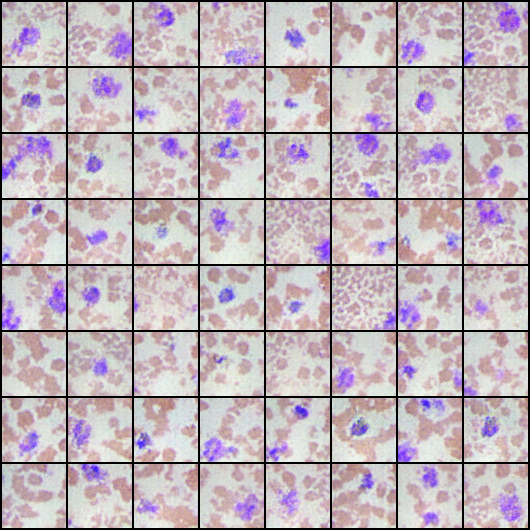

In [93]:
Image('./generated/generated-images-1000.png')

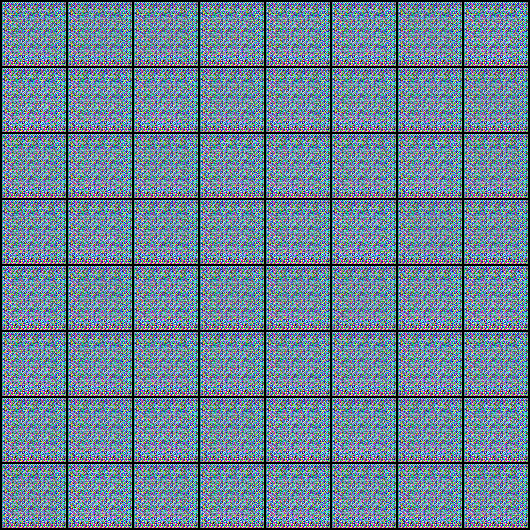

In [101]:
Image('./generated/generated-images-0010.png')

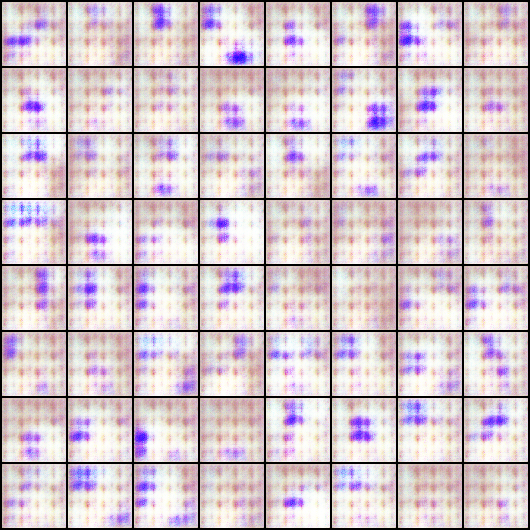

In [95]:
Image('./generated/generated-images-0100.png')

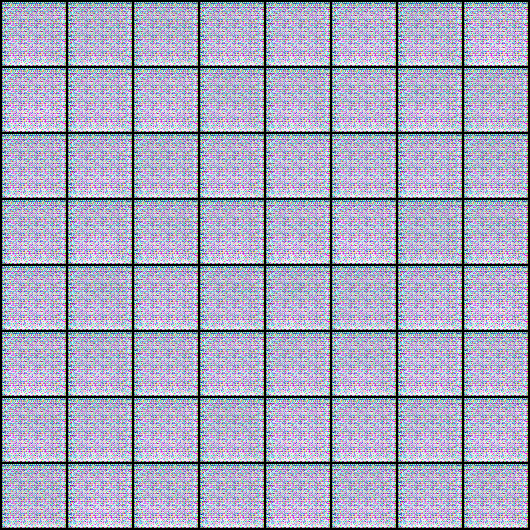

In [96]:
Image('./generated/generated-images-0500.png')

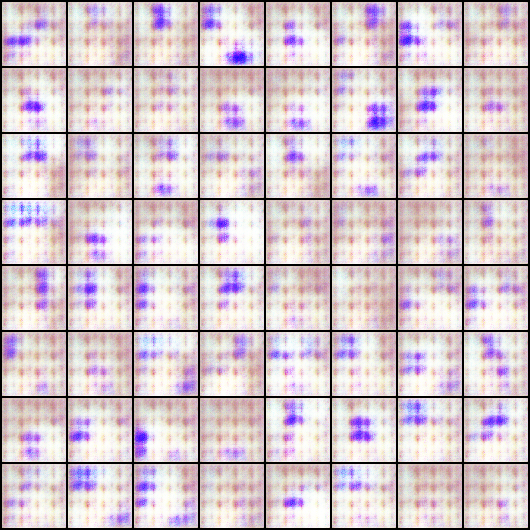

In [97]:
Image('./generated/generated-images-1000.png')

In [98]:
import cv2
import os

vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

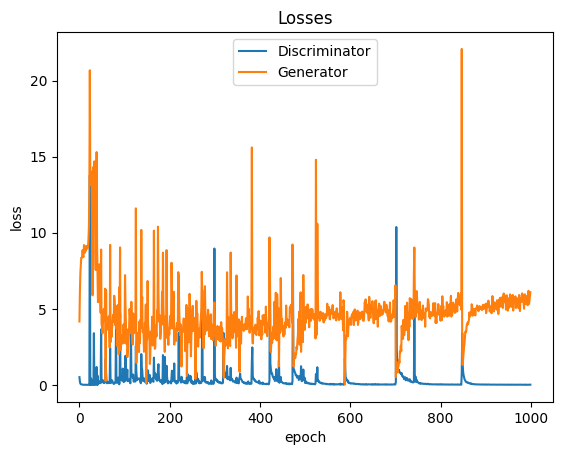

In [99]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

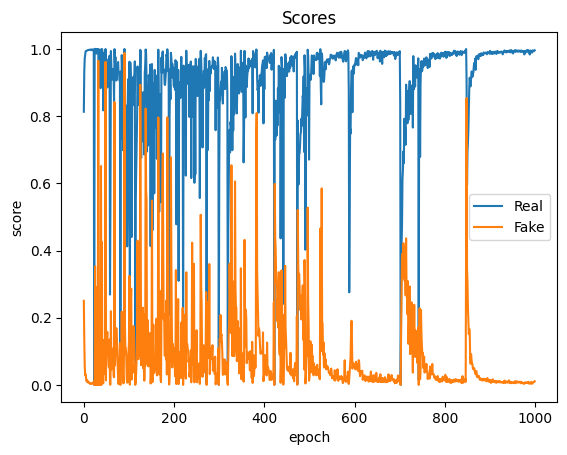

In [100]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');